In [91]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans 
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
%matplotlib inline

In [92]:
%pip install xlrd 
df=pd.read_excel('Clustering+Clean+Ads_Data.xlsx')

Note: you may need to restart the kernel to use updated packages.


In [93]:
df.head().T

,0,1,2,3,4
Timestamp,2020-9-2-17,2020-9-2-10,2020-9-1-22,2020-9-3-20,2020-9-4-15
InventoryType,Format1,Format1,Format1,Format1,Format1
Ad - Length,300,300,300,300,300
Ad- Width,250,250,250,250,250
Ad Size,75000,75000,75000,75000,75000
Ad Type,Inter222,Inter227,Inter222,Inter228,Inter217
Platform,Video,App,Video,Video,Web
Device Type,Desktop,Mobile,Desktop,Mobile,Desktop
Format,Display,Video,Display,Video,Video
Available_Impressions,1806,1780,2727,2430,1218


In [94]:
df.tail().T

,23061,23062,23063,23064,23065
Timestamp,2020-9-13-7,2020-11-2-7,2020-9-14-22,2020-11-18-2,2020-9-14-0
InventoryType,Format5,Format5,Format5,Format4,Format5
Ad - Length,720,720,720,120,720
Ad- Width,300,300,300,600,300
Ad Size,216000,216000,216000,72000,216000
Ad Type,Inter220,Inter224,Inter218,inter230,Inter221
Platform,Web,Web,App,Video,App
Device Type,Mobile,Desktop,Mobile,Mobile,Mobile
Format,Video,Video,Video,Video,Video
Available_Impressions,1,3,2,7,2


In [95]:
df.shape

(23066, 19)

In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Timestamp              23066 non-null  object 
 1   InventoryType          23066 non-null  object 
 2   Ad - Length            23066 non-null  int64  
 3   Ad- Width              23066 non-null  int64  
 4   Ad Size                23066 non-null  int64  
 5   Ad Type                23066 non-null  object 
 6   Platform               23066 non-null  object 
 7   Device Type            23066 non-null  object 
 8   Format                 23066 non-null  object 
 9   Available_Impressions  23066 non-null  int64  
 10  Matched_Queries        23066 non-null  int64  
 11  Impressions            23066 non-null  int64  
 12  Clicks                 23066 non-null  int64  
 13  Spend                  23066 non-null  float64
 14  Fee                    23066 non-null  float64
 15  Re

In [97]:
df.isnull().sum()

Timestamp                   0
InventoryType               0
Ad - Length                 0
Ad- Width                   0
Ad Size                     0
Ad Type                     0
Platform                    0
Device Type                 0
Format                      0
Available_Impressions       0
Matched_Queries             0
Impressions                 0
Clicks                      0
Spend                       0
Fee                         0
Revenue                     0
CTR                      4736
CPM                      4736
CPC                      4736
dtype: int64

In [98]:
df.duplicated().sum()

0

In [99]:
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
23061    False
23062    False
23063    False
23064    False
23065    False
Length: 23066, dtype: bool

In [100]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,3.851631e+02,2.336514e+02,120.0000,120.000000,300.00000,7.200000e+02,728.00
Ad- Width,23066.0,3.378960e+02,2.030929e+02,70.0000,250.000000,300.00000,6.000000e+02,600.00
Ad Size,23066.0,9.667447e+04,6.153833e+04,33600.0000,72000.000000,72000.00000,8.400000e+04,216000.00
Available_Impressions,23066.0,2.432044e+06,4.742888e+06,1.0000,33672.250000,483771.00000,2.527712e+06,27592861.00
Matched_Queries,23066.0,1.295099e+06,2.512970e+06,1.0000,18282.500000,258087.50000,1.180700e+06,14702025.00
Impressions,23066.0,1.241520e+06,2.429400e+06,1.0000,7990.500000,225290.00000,1.112428e+06,14194774.00
Clicks,23066.0,1.067852e+04,1.735341e+04,1.0000,710.000000,4425.00000,1.279375e+04,143049.00
Spend,23066.0,2.706626e+03,4.067927e+03,0.0000,85.180000,1425.12500,3.121400e+03,26931.87
Fee,23066.0,3.351231e-01,3.196322e-02,0.2100,0.330000,0.35000,3.500000e-01,0.35
Revenue,23066.0,1.924252e+03,3.105238e+03,0.0000,55.365375,926.33500,2.091338e+03,21276.18


In [101]:
def univariateAnalysis_numeric_basic(column,nbins):
    print("Description of " + column)
    print("----------------------------------------------------------------------------")
    print(df[column].describe(),end=' ')
    
    
    plt.figure()
    print("Distribution of " + column)
    print("----------------------------------------------------------------------------")
    sns.distplot(df[column], kde=False, color='g',bins=nbins);
    plt.show()
    
    plt.figure()
    print("BoxPlot of " + column)
    print("----------------------------------------------------------------------------")
    ax = sns.boxplot(x=df[column])
    plt.show()

Description of Ad - Length
----------------------------------------------------------------------------
count    23066.000000
mean       385.163097
std        233.651434
min        120.000000
25%        120.000000
50%        300.000000
75%        720.000000
max        728.000000
Name: Ad - Length, dtype: float64 Distribution of Ad - Length
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


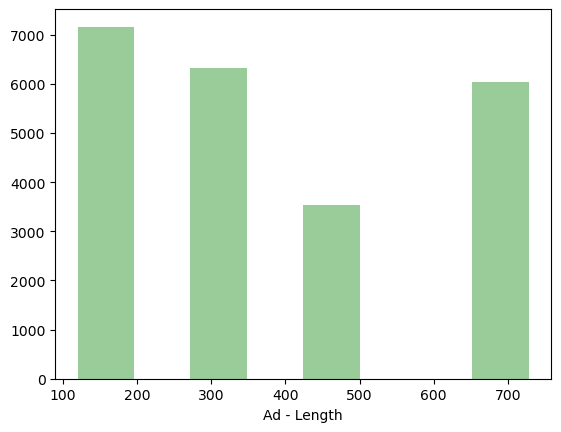

BoxPlot of Ad - Length
----------------------------------------------------------------------------


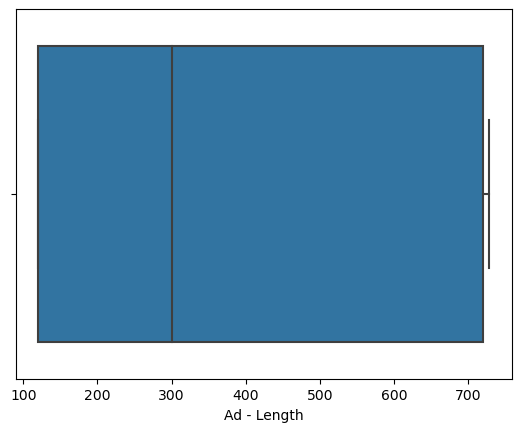

Description of Ad- Width
----------------------------------------------------------------------------
count    23066.000000
mean       337.896037
std        203.092885
min         70.000000
25%        250.000000
50%        300.000000
75%        600.000000
max        600.000000
Name: Ad- Width, dtype: float64 Distribution of Ad- Width
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


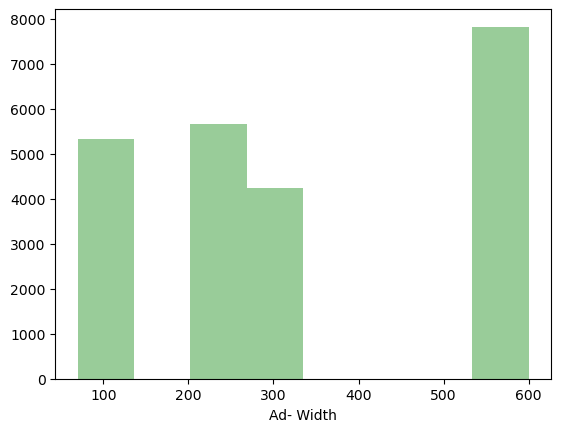

BoxPlot of Ad- Width
----------------------------------------------------------------------------


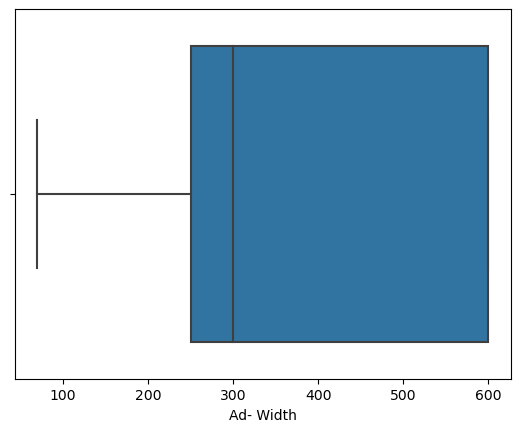

Description of Ad Size
----------------------------------------------------------------------------
count     23066.000000
mean      96674.468048
std       61538.329557
min       33600.000000
25%       72000.000000
50%       72000.000000
75%       84000.000000
max      216000.000000
Name: Ad Size, dtype: float64 Distribution of Ad Size
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


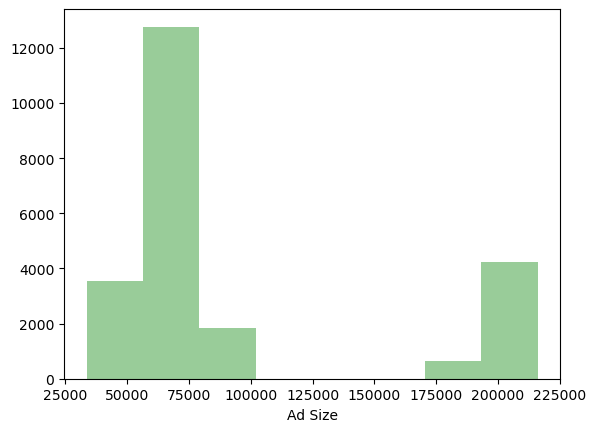

BoxPlot of Ad Size
----------------------------------------------------------------------------


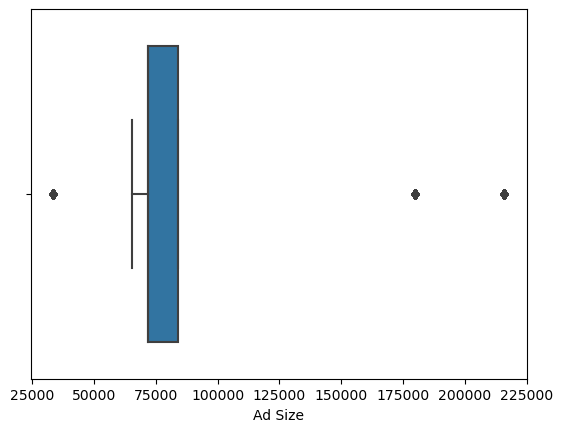

Description of Available_Impressions
----------------------------------------------------------------------------
count    2.306600e+04
mean     2.432044e+06
std      4.742888e+06
min      1.000000e+00
25%      3.367225e+04
50%      4.837710e+05
75%      2.527712e+06
max      2.759286e+07
Name: Available_Impressions, dtype: float64 Distribution of Available_Impressions
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


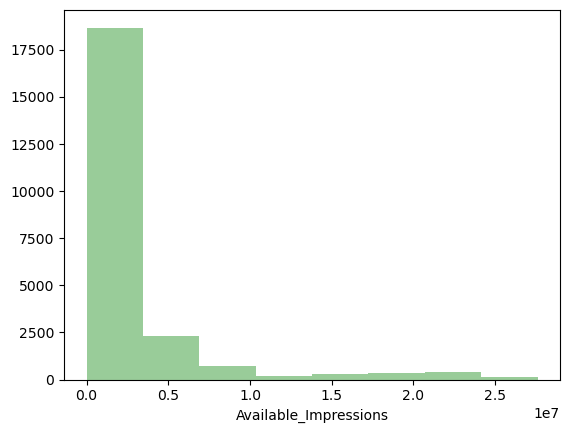

BoxPlot of Available_Impressions
----------------------------------------------------------------------------


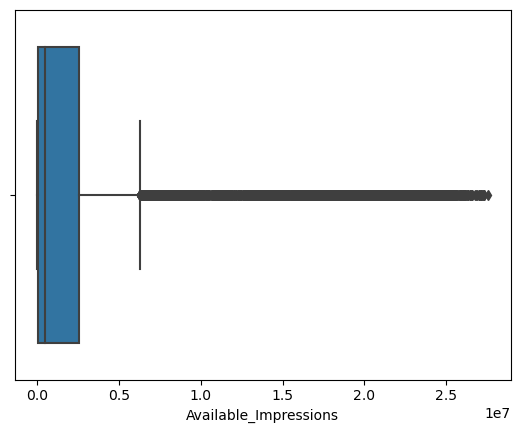

Description of Matched_Queries
----------------------------------------------------------------------------
count    2.306600e+04
mean     1.295099e+06
std      2.512970e+06
min      1.000000e+00
25%      1.828250e+04
50%      2.580875e+05
75%      1.180700e+06
max      1.470202e+07
Name: Matched_Queries, dtype: float64 Distribution of Matched_Queries
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


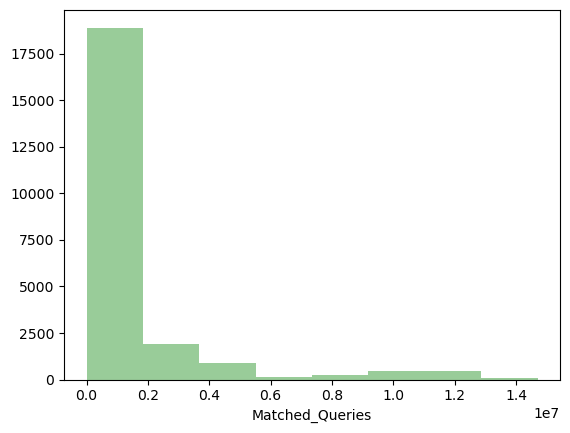

BoxPlot of Matched_Queries
----------------------------------------------------------------------------


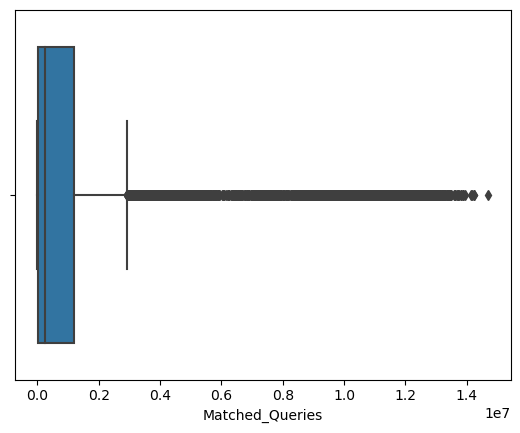

C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


Description of Impressions
----------------------------------------------------------------------------
count    2.306600e+04
mean     1.241520e+06
std      2.429400e+06
min      1.000000e+00
25%      7.990500e+03
50%      2.252900e+05
75%      1.112428e+06
max      1.419477e+07
Name: Impressions, dtype: float64 Distribution of Impressions
----------------------------------------------------------------------------


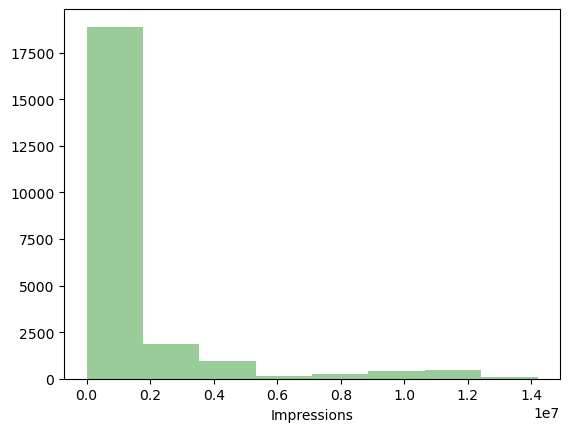

BoxPlot of Impressions
----------------------------------------------------------------------------


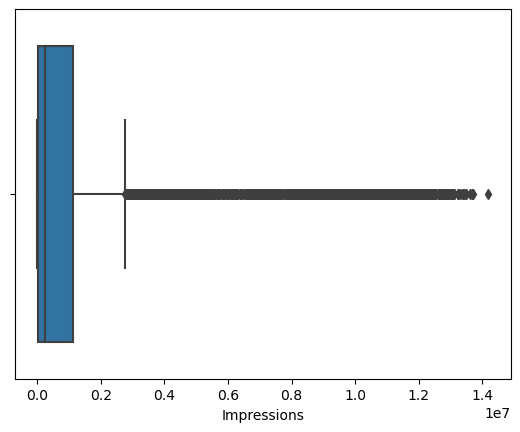

Description of Clicks
----------------------------------------------------------------------------
count     23066.000000
mean      10678.518816
std       17353.409363
min           1.000000
25%         710.000000
50%        4425.000000
75%       12793.750000
max      143049.000000
Name: Clicks, dtype: float64 Distribution of Clicks
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


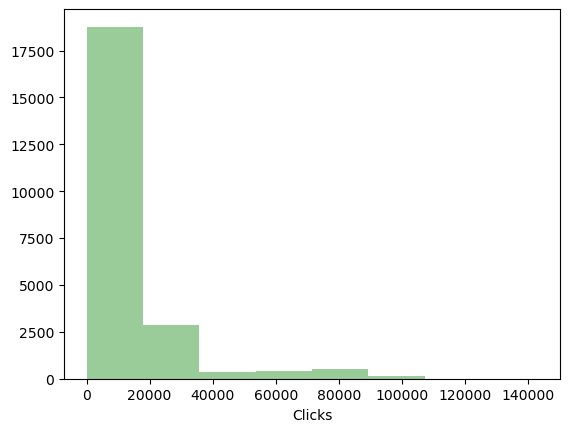

BoxPlot of Clicks
----------------------------------------------------------------------------


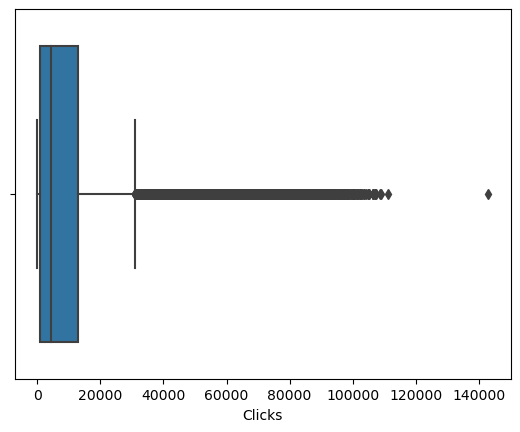

In [102]:
univariateAnalysis_numeric_basic('Ad - Length',8)
univariateAnalysis_numeric_basic('Ad- Width',8)
univariateAnalysis_numeric_basic('Ad Size',8)
univariateAnalysis_numeric_basic('Available_Impressions',8)
univariateAnalysis_numeric_basic('Matched_Queries',8)
univariateAnalysis_numeric_basic('Impressions',8)
univariateAnalysis_numeric_basic('Clicks',8)


In [103]:
df_num = df.select_dtypes(include = ['float64', 'int64'])
lstnumericcolumns = list(df_num.columns.values)
len(lstnumericcolumns)

13

In [104]:
df_num.head()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,300,250,75000,1806,325,323,1,0.0,0.35,0.0,0.0031,0.0,0.0
1,300,250,75000,1780,285,285,1,0.0,0.35,0.0,0.0035,0.0,0.0
2,300,250,75000,2727,356,355,1,0.0,0.35,0.0,0.0028,0.0,0.0
3,300,250,75000,2430,497,495,1,0.0,0.35,0.0,0.0020,0.0,0.0
4,300,250,75000,1218,242,242,1,0.0,0.35,0.0,0.0041,0.0,0.0


Description of Ad - Length
----------------------------------------------------------------------------
count    23066.000000
mean       385.163097
std        233.651434
min        120.000000
25%        120.000000
50%        300.000000
75%        720.000000
max        728.000000
Name: Ad - Length, dtype: float64 Distribution of Ad - Length
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


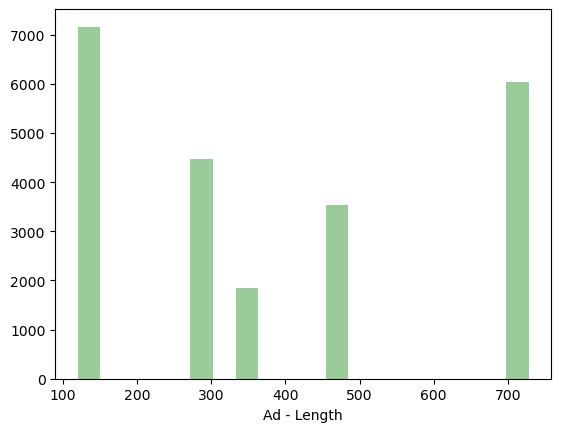

BoxPlot of Ad - Length
----------------------------------------------------------------------------


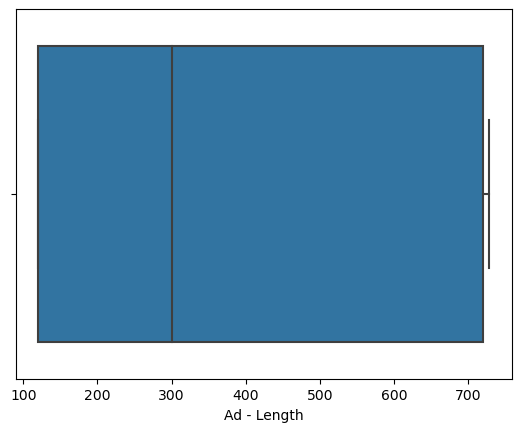

Description of Ad- Width
----------------------------------------------------------------------------
count    23066.000000
mean       337.896037
std        203.092885
min         70.000000
25%        250.000000
50%        300.000000
75%        600.000000
max        600.000000
Name: Ad- Width, dtype: float64 Distribution of Ad- Width
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


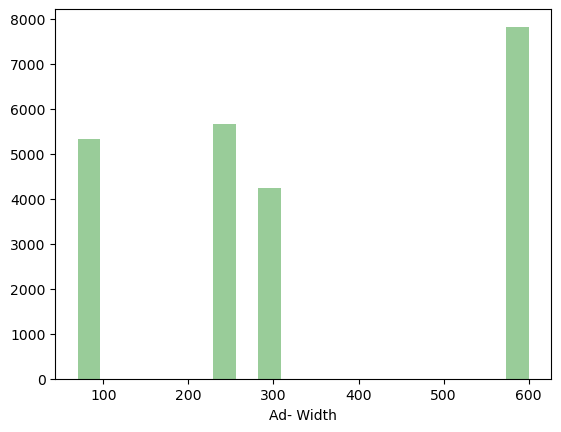

BoxPlot of Ad- Width
----------------------------------------------------------------------------


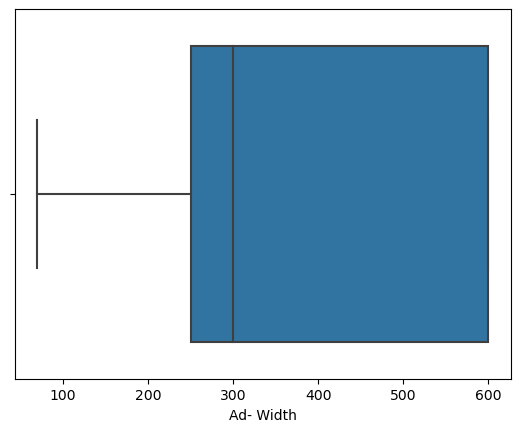

Description of Ad Size
----------------------------------------------------------------------------
count     23066.000000
mean      96674.468048
std       61538.329557
min       33600.000000
25%       72000.000000
50%       72000.000000
75%       84000.000000
max      216000.000000
Name: Ad Size, dtype: float64 Distribution of Ad Size
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


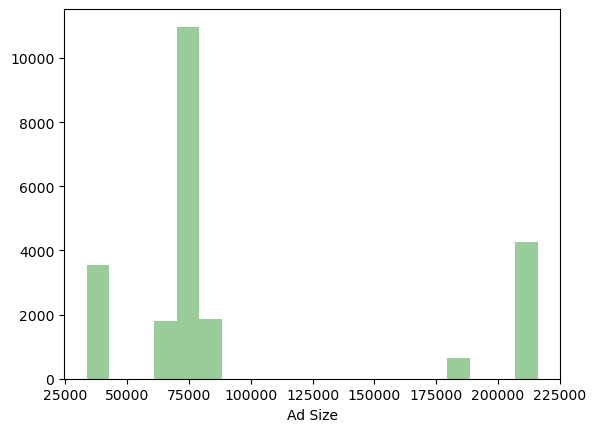

BoxPlot of Ad Size
----------------------------------------------------------------------------


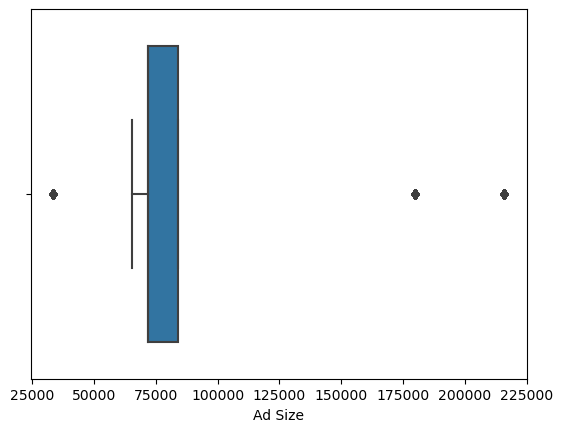

Description of Available_Impressions
----------------------------------------------------------------------------
count    2.306600e+04
mean     2.432044e+06
std      4.742888e+06
min      1.000000e+00
25%      3.367225e+04
50%      4.837710e+05
75%      2.527712e+06
max      2.759286e+07
Name: Available_Impressions, dtype: float64 Distribution of Available_Impressions
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


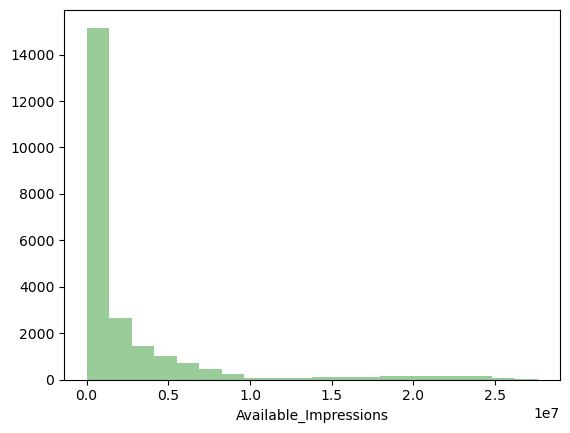

BoxPlot of Available_Impressions
----------------------------------------------------------------------------


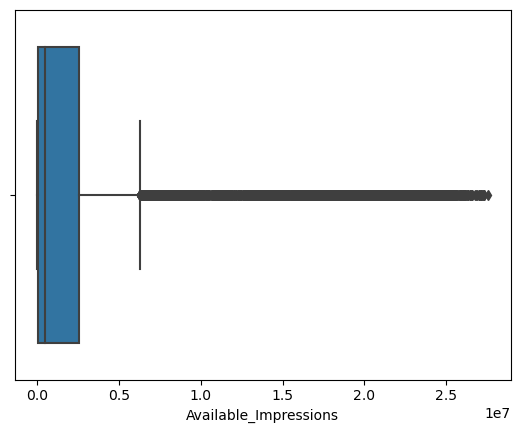

C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


Description of Matched_Queries
----------------------------------------------------------------------------
count    2.306600e+04
mean     1.295099e+06
std      2.512970e+06
min      1.000000e+00
25%      1.828250e+04
50%      2.580875e+05
75%      1.180700e+06
max      1.470202e+07
Name: Matched_Queries, dtype: float64 Distribution of Matched_Queries
----------------------------------------------------------------------------


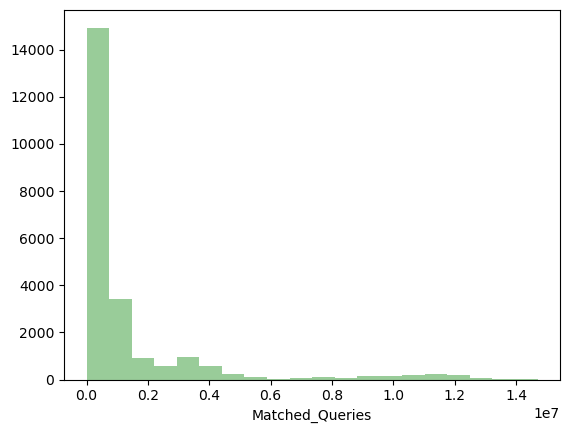

BoxPlot of Matched_Queries
----------------------------------------------------------------------------


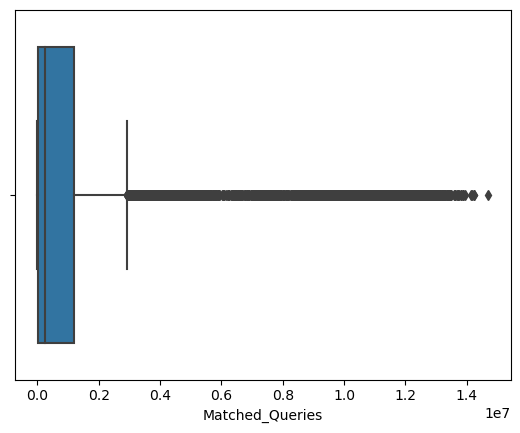

Description of Impressions
----------------------------------------------------------------------------
count    2.306600e+04
mean     1.241520e+06
std      2.429400e+06
min      1.000000e+00
25%      7.990500e+03
50%      2.252900e+05
75%      1.112428e+06
max      1.419477e+07
Name: Impressions, dtype: float64 Distribution of Impressions
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


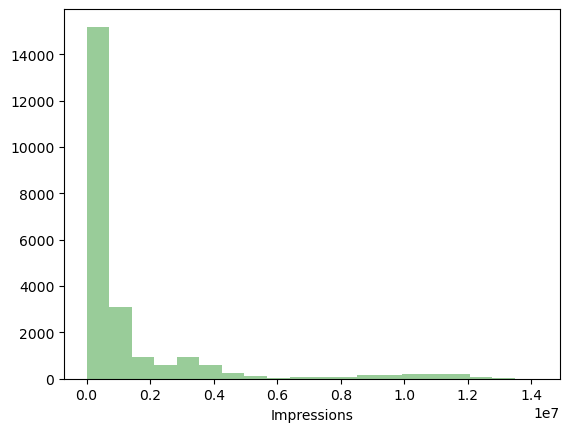

BoxPlot of Impressions
----------------------------------------------------------------------------


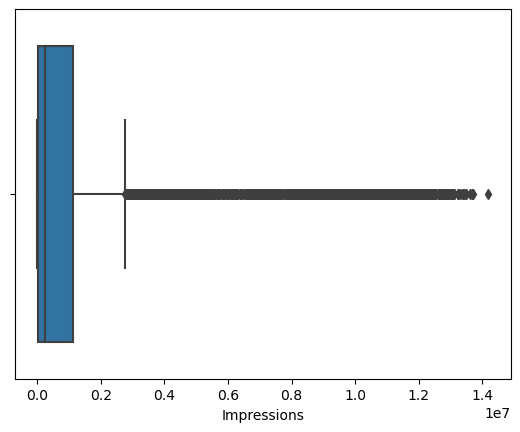

Description of Clicks
----------------------------------------------------------------------------
count     23066.000000
mean      10678.518816
std       17353.409363
min           1.000000
25%         710.000000
50%        4425.000000
75%       12793.750000
max      143049.000000
Name: Clicks, dtype: float64 Distribution of Clicks
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


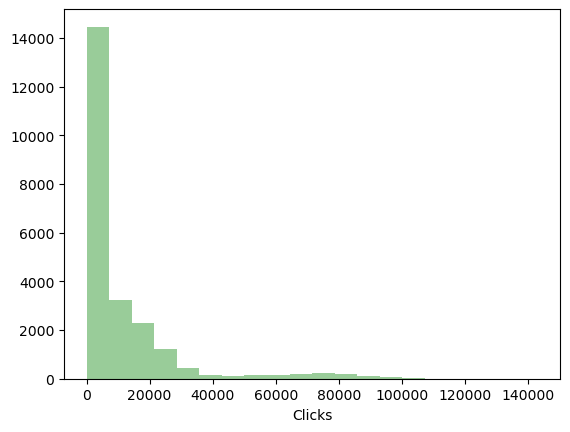

BoxPlot of Clicks
----------------------------------------------------------------------------


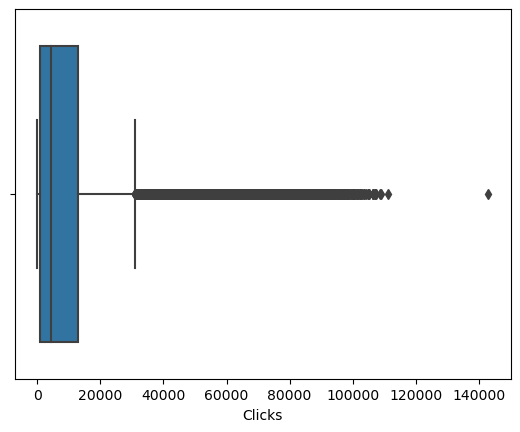

Description of Spend
----------------------------------------------------------------------------
count    23066.000000
mean      2706.625689
std       4067.927273
min          0.000000
25%         85.180000
50%       1425.125000
75%       3121.400000
max      26931.870000
Name: Spend, dtype: float64 Distribution of Spend
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


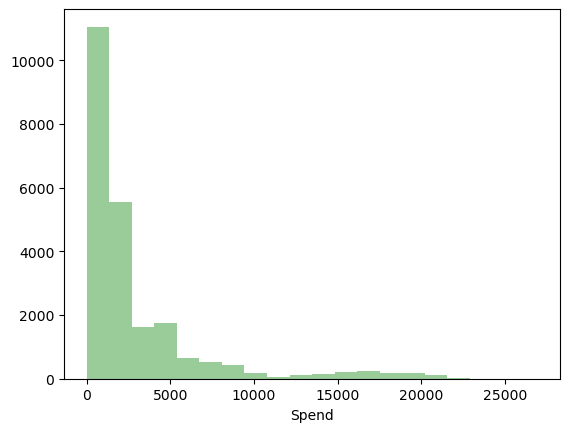

BoxPlot of Spend
----------------------------------------------------------------------------


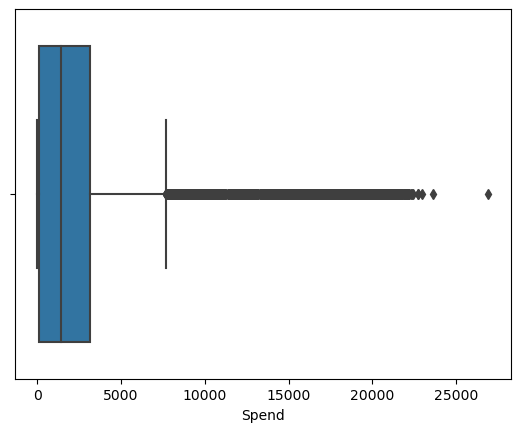

C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


Description of Fee
----------------------------------------------------------------------------
count    23066.000000
mean         0.335123
std          0.031963
min          0.210000
25%          0.330000
50%          0.350000
75%          0.350000
max          0.350000
Name: Fee, dtype: float64 Distribution of Fee
----------------------------------------------------------------------------


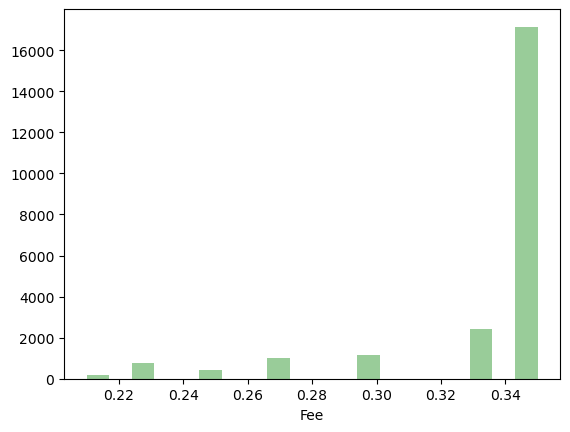

BoxPlot of Fee
----------------------------------------------------------------------------


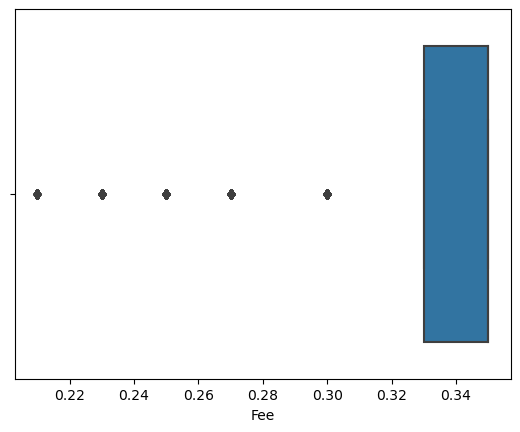

Description of Revenue
----------------------------------------------------------------------------
count    23066.000000
mean      1924.252331
std       3105.238410
min          0.000000
25%         55.365375
50%        926.335000
75%       2091.338150
max      21276.180000
Name: Revenue, dtype: float64 Distribution of Revenue
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


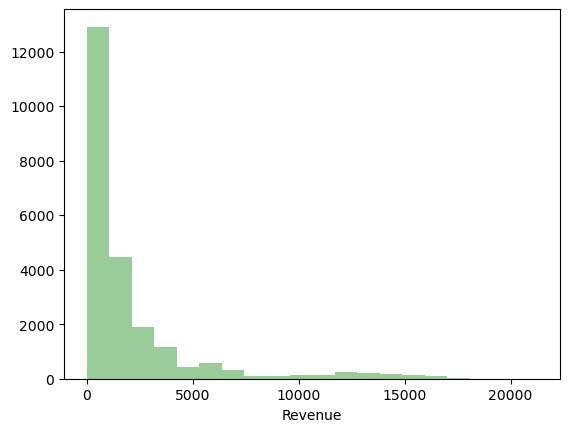

BoxPlot of Revenue
----------------------------------------------------------------------------


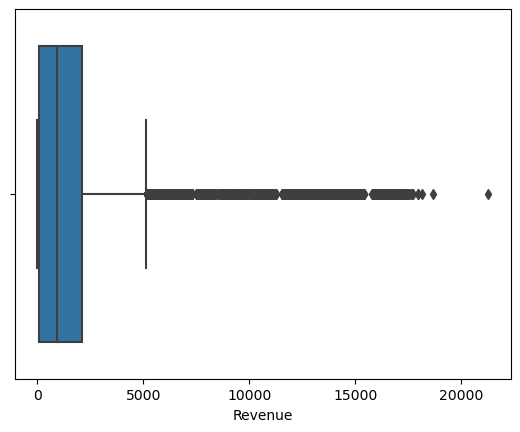

C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


Description of CTR
----------------------------------------------------------------------------
count    18330.000000
mean         0.073661
std          0.075160
min          0.000100
25%          0.002600
50%          0.082550
75%          0.130000
max          1.000000
Name: CTR, dtype: float64 Distribution of CTR
----------------------------------------------------------------------------


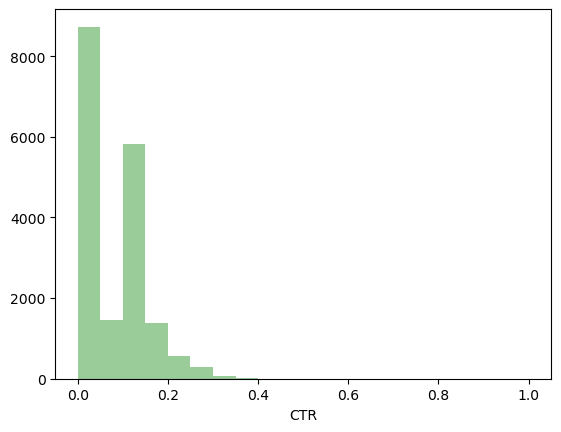

BoxPlot of CTR
----------------------------------------------------------------------------


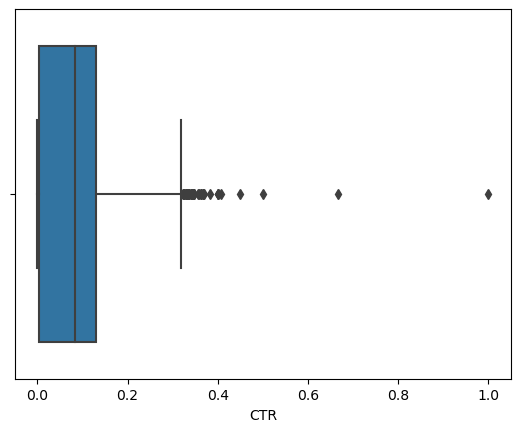

C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


Description of CPM
----------------------------------------------------------------------------
count    18330.000000
mean         7.672045
std          6.481391
min          0.000000
25%          1.710000
50%          7.660000
75%         12.510000
max         81.560000
Name: CPM, dtype: float64 Distribution of CPM
----------------------------------------------------------------------------


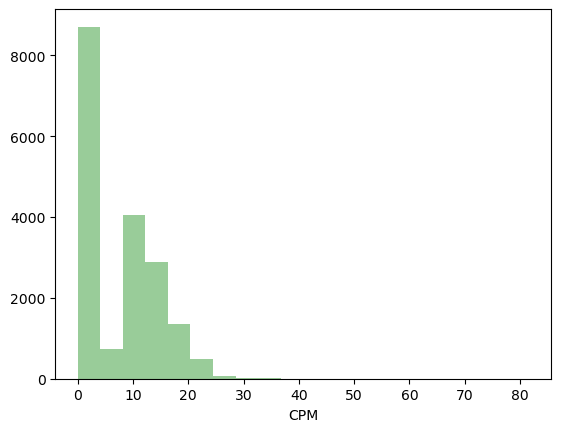

BoxPlot of CPM
----------------------------------------------------------------------------


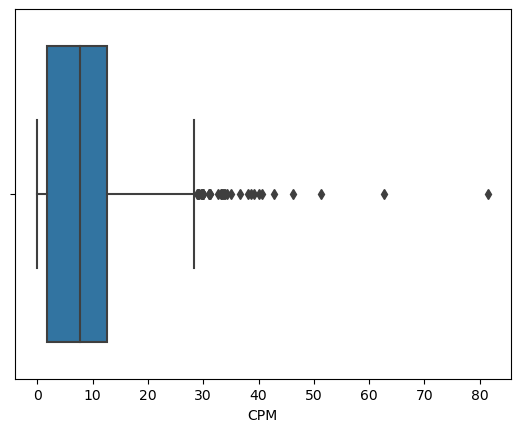

Description of CPC
----------------------------------------------------------------------------
count    18330.000000
mean         0.351061
std          0.343334
min          0.000000
25%          0.090000
50%          0.160000
75%          0.570000
max          7.260000
Name: CPC, dtype: float64 Distribution of CPC
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9428\2712359391.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column], kde=False, color='g',bins=nbins);


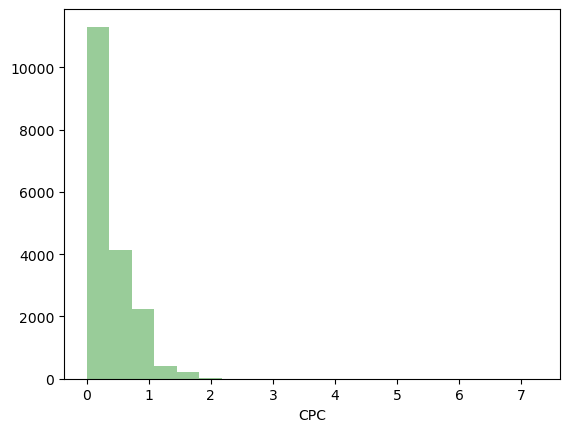

BoxPlot of CPC
----------------------------------------------------------------------------


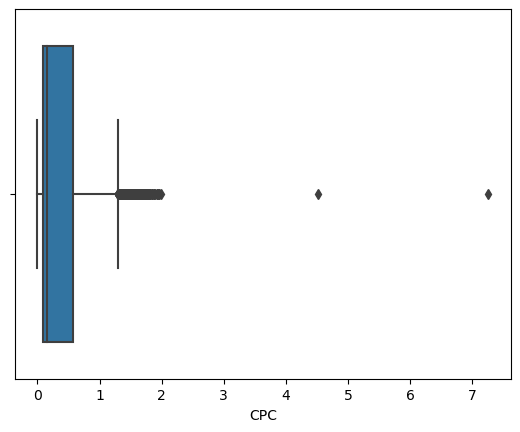

In [105]:
for x in lstnumericcolumns:
    univariateAnalysis_numeric_basic(x,20)

C:\Users\THANUSRI\anaconda31\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


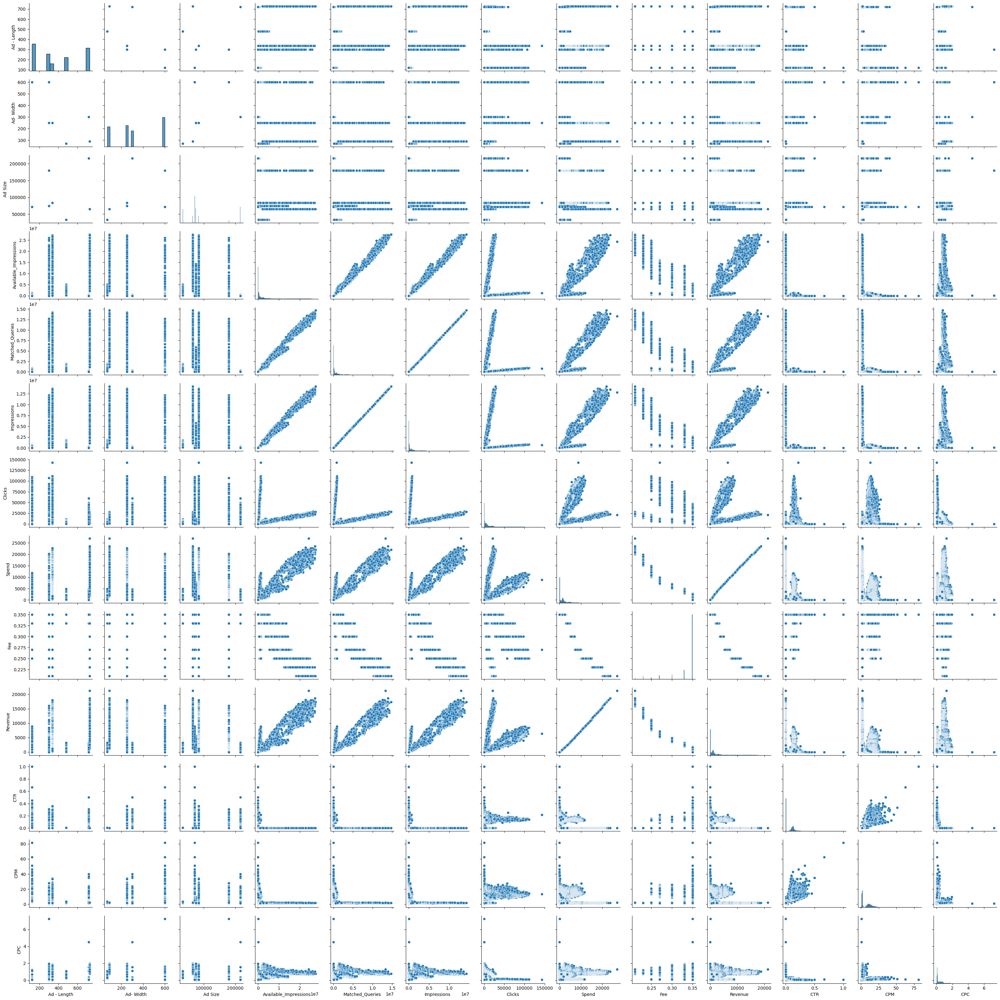

In [106]:
sns.pairplot(df_num)

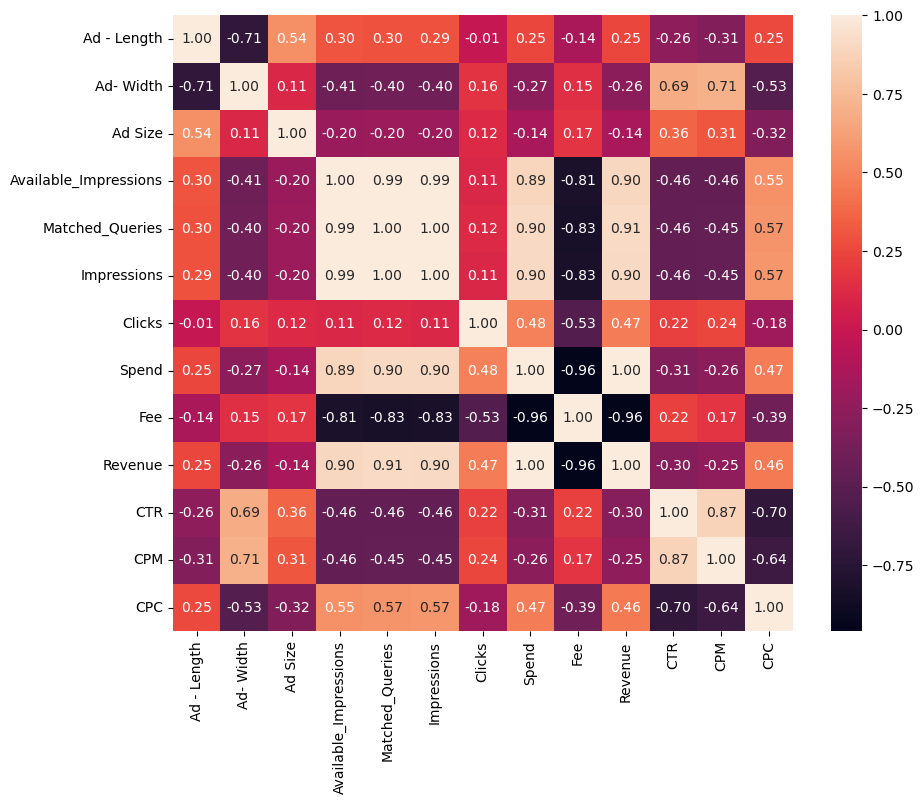

In [107]:
plt.figure(figsize=(10,8))
sns.heatmap(df_num.corr(),annot=True,fmt='.2f');

In [108]:
df.isnull().sum()

Timestamp                   0
InventoryType               0
Ad - Length                 0
Ad- Width                   0
Ad Size                     0
Ad Type                     0
Platform                    0
Device Type                 0
Format                      0
Available_Impressions       0
Matched_Queries             0
Impressions                 0
Clicks                      0
Spend                       0
Fee                         0
Revenue                     0
CTR                      4736
CPM                      4736
CPC                      4736
dtype: int64

In [109]:
def calculate_ctr(x):
    clicks=df.Clicks
    impressions=df.Impressions
    ctr=(clicks/impressions)*100
    return ctr

In [110]:
def calculate_cpc(x):
    spend=df.Spend
    clicks=df.Clicks
    cpc=(spend/clicks)
    return cpc

In [111]:
def calculate_cpm(x):
    spend=df.Spend
    impressions=df.Impressions
    cpm=(spend/impressions)*1000
    return cpm

In [112]:
df['CTR']=df[['CTR']].apply(lambda x:calculate_ctr(x))
df['CPM']=df[['CPM']].apply(lambda x:calculate_cpm(x))
df['CPC']=df[['CPC']].apply(lambda x:calculate_cpc(x))

In [113]:
df.isnull().sum()

Timestamp                0
InventoryType            0
Ad - Length              0
Ad- Width                0
Ad Size                  0
Ad Type                  0
Platform                 0
Device Type              0
Format                   0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
dtype: int64

In [114]:
numdata = df.select_dtypes(include=[np.number])
catdata = df.select_dtypes(exclude=[np.number])

In [115]:
numdata.head()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,300,250,75000,1806,325,323,1,0.0,0.35,0.0,0.309598,0.0,0.0
1,300,250,75000,1780,285,285,1,0.0,0.35,0.0,0.350877,0.0,0.0
2,300,250,75000,2727,356,355,1,0.0,0.35,0.0,0.281690,0.0,0.0
3,300,250,75000,2430,497,495,1,0.0,0.35,0.0,0.202020,0.0,0.0
4,300,250,75000,1218,242,242,1,0.0,0.35,0.0,0.413223,0.0,0.0


In [116]:
numdata.tail()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
23061,720,300,216000,1,1,1,1,0.07,0.35,0.0455,100.0,70.0,0.07
23062,720,300,216000,3,2,2,1,0.04,0.35,0.0260,50.0,20.0,0.04
23063,720,300,216000,2,1,1,1,0.05,0.35,0.0325,100.0,50.0,0.05
23064,120,600,72000,7,1,1,1,0.07,0.35,0.0455,100.0,70.0,0.07
23065,720,300,216000,2,2,2,1,0.09,0.35,0.0585,50.0,45.0,0.09


<Axes: >

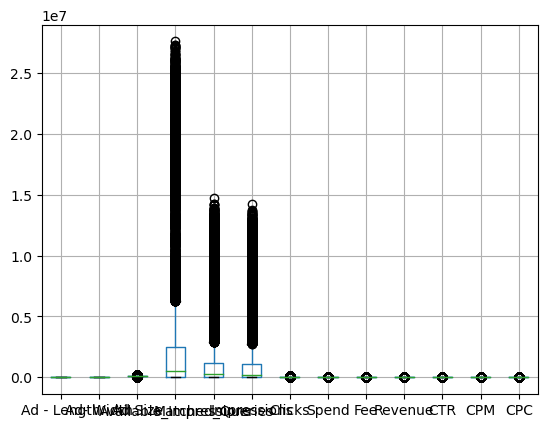

In [117]:
numdata.boxplot()

IndexError: single positional indexer is out-of-bounds

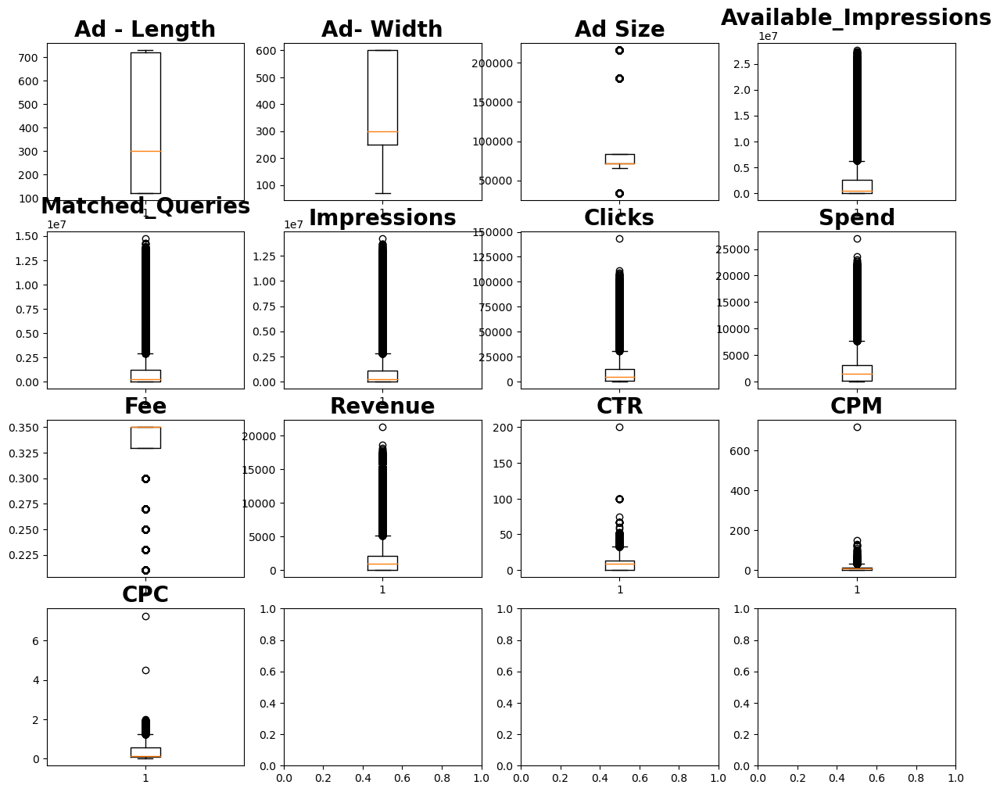

In [118]:
fig,axs=plt.subplots(nrows=4,ncols=4,figsize=(15,12))
for i,ax in enumerate(axs.flat):
    ax.boxplot(numdata.iloc[:,i])
    numdata.iloc[:,i]
    ax.set_title(numdata.columns[i],fontsize=20,fontweight='bold')
    
plt.tight_layout()



In [119]:
def detect_outlier(col):
    Q1,Q3=np.percentile(col,(25,75))
    IQR=Q3-Q1
    lower_range=Q1-(1.5*IQR)
    upper_range=Q3+(1.5*IQR)
    return lower_range,upper_range
    
lr,ur=detect_outlier(numdata['Clicks'])

In [120]:
numdata['Clicks']=np.where(numdata['Clicks']>ur,ur,numdata['Clicks'])
numdata['Clicks']=np.where(numdata['Clicks']<lr,lr,numdata['Clicks'])

In [121]:
def detect_outlier(col):
    Q1,Q3=np.percentile(col,(25,75))
    IQR=Q3-Q1
    lower_range=Q1-(1.5*IQR)
    upper_range=Q3+(1.5*IQR)
    return lower_range,upper_range
for column in numdata:
    
    lr,ur=detect_outlier(numdata[column])

    numdata[column]=np.where(numdata[column]>ur,ur,numdata[column])
    numdata[column]=np.where(numdata[column]<lr,lr,numdata[column])

IndexError: single positional indexer is out-of-bounds

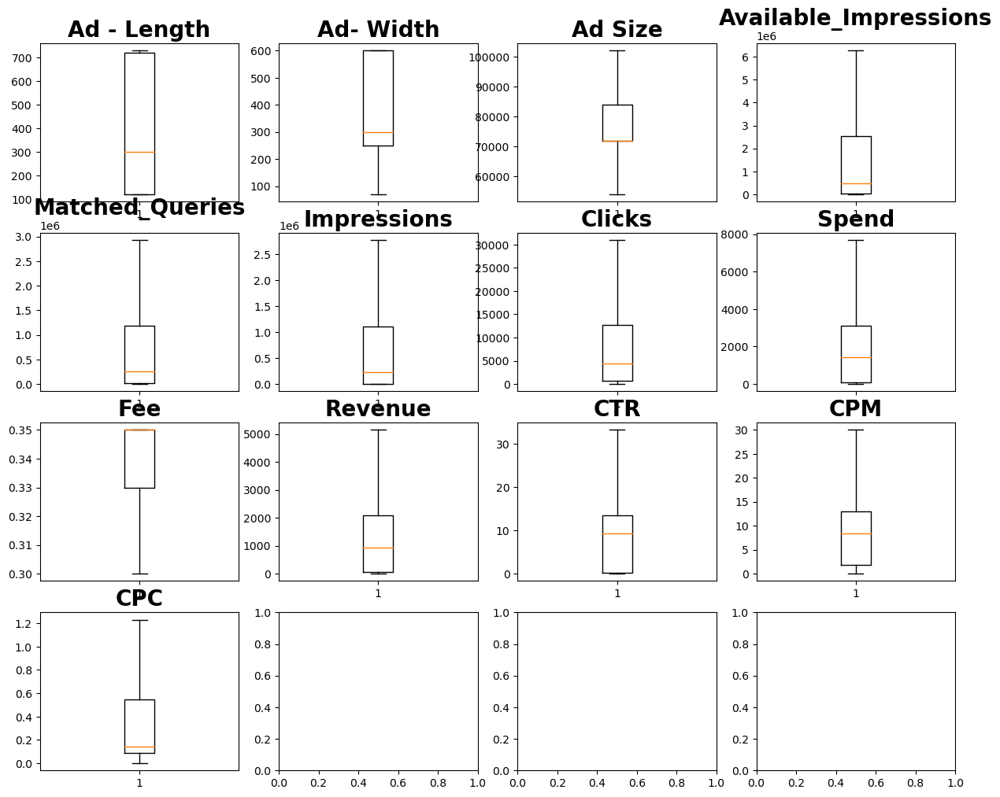

In [122]:
fig,axs=plt.subplots(nrows=4,ncols=4,figsize=(15,12))
for i,ax in enumerate(axs.flat):
    ax.boxplot(numdata.iloc[:,i])
    numdata.iloc[:,i]
    ax.set_title(numdata.columns[i],fontsize=20,fontweight='bold')
    
plt.tight_layout()


The description statistics for 'Ad - Length' column is:


count    23066.000000
mean       385.163097
std        233.651434
min        120.000000
25%        120.000000
50%        300.000000
75%        720.000000
max        728.000000
Name: Ad - Length, dtype: float64


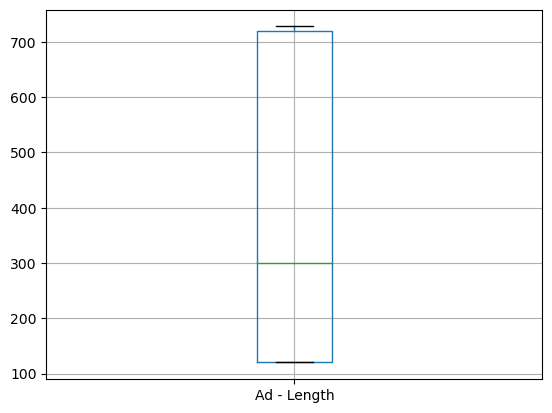

The description statistics for 'Ad- Width' column is:


count    23066.000000
mean       337.896037
std        203.092885
min         70.000000
25%        250.000000
50%        300.000000
75%        600.000000
max        600.000000
Name: Ad- Width, dtype: float64


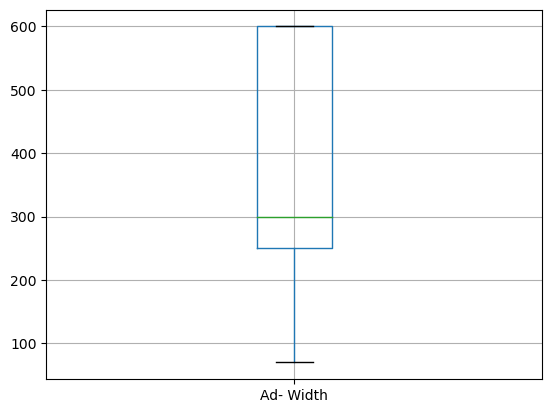

The description statistics for 'Ad Size' column is:


count     23066.000000
mean      76576.835169
std       15381.320695
min       54000.000000
25%       72000.000000
50%       72000.000000
75%       84000.000000
max      102000.000000
Name: Ad Size, dtype: float64


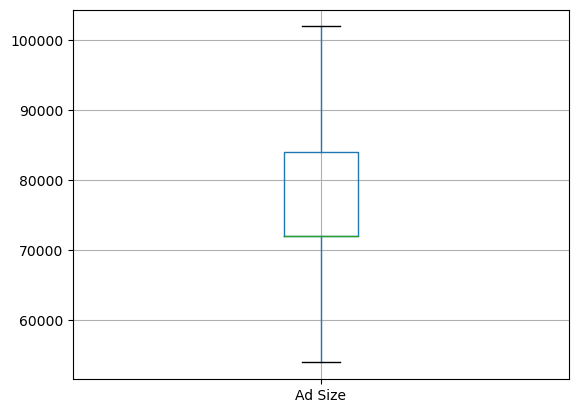

The description statistics for 'Available_Impressions' column is:


count    2.306600e+04
mean     1.607253e+06
std      2.125528e+06
min      1.000000e+00
25%      3.367225e+04
50%      4.837710e+05
75%      2.527712e+06
max      6.268771e+06
Name: Available_Impressions, dtype: float64


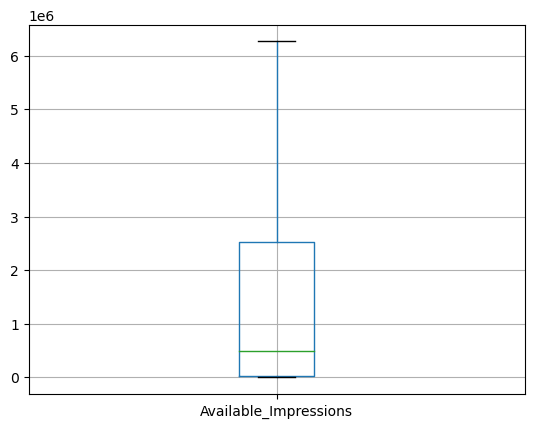

The description statistics for 'Matched_Queries' column is:


count    2.306600e+04
mean     7.995380e+05
std      1.026037e+06
min      1.000000e+00
25%      1.828250e+04
50%      2.580875e+05
75%      1.180700e+06
max      2.924326e+06
Name: Matched_Queries, dtype: float64


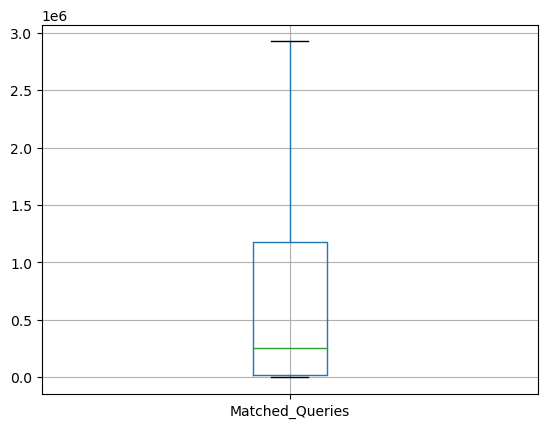

The description statistics for 'Impressions' column is:


count    2.306600e+04
mean     7.536120e+05
std      9.802568e+05
min      1.000000e+00
25%      7.990500e+03
50%      2.252900e+05
75%      1.112428e+06
max      2.769086e+06
Name: Impressions, dtype: float64


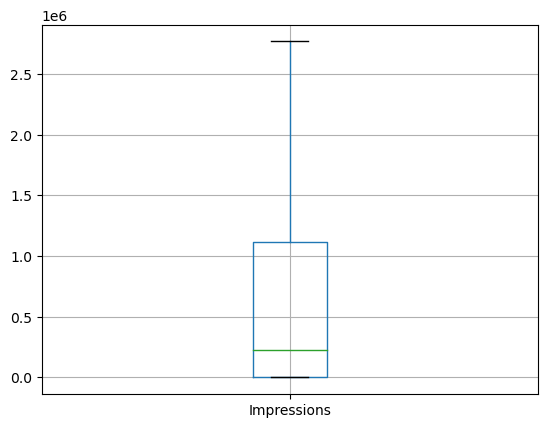

The description statistics for 'Clicks' column is:


count    23066.000000
mean      8306.828194
std       9574.779384
min          1.000000
25%        710.000000
50%       4425.000000
75%      12793.750000
max      30919.375000
Name: Clicks, dtype: float64


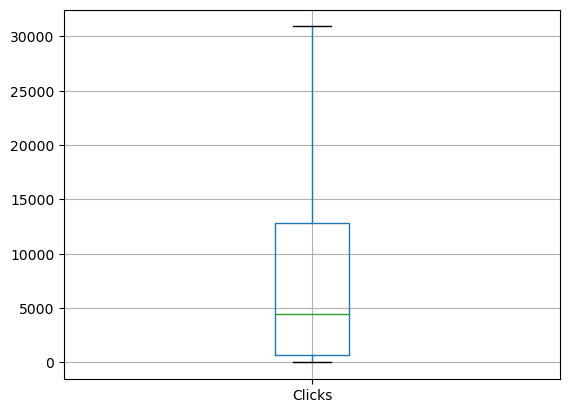

The description statistics for 'Spend' column is:


count    23066.000000
mean      2166.060098
std       2425.189632
min          0.000000
25%         85.180000
50%       1425.125000
75%       3121.400000
max       7675.730000
Name: Spend, dtype: float64


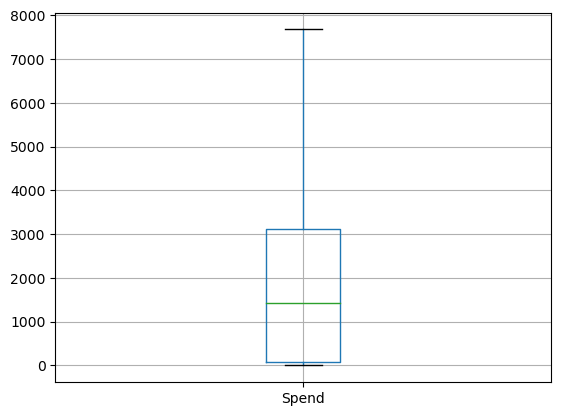

The description statistics for 'Fee' column is:


count    23066.000000
mean         0.340288
std          0.018129
min          0.300000
25%          0.330000
50%          0.350000
75%          0.350000
max          0.350000
Name: Fee, dtype: float64


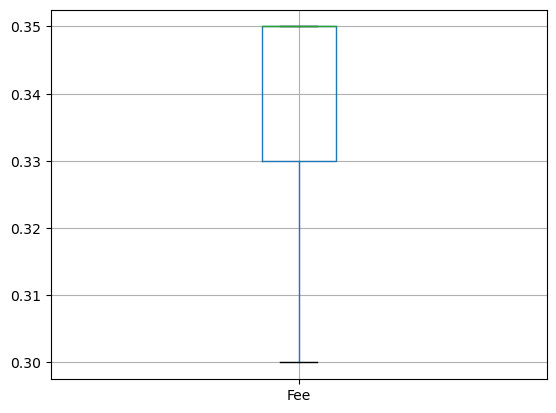

The description statistics for 'Revenue' column is:


count    23066.000000
mean      1449.388572
std       1646.893583
min          0.000000
25%         55.365375
50%        926.335000
75%       2091.338150
max       5145.297312
Name: Revenue, dtype: float64


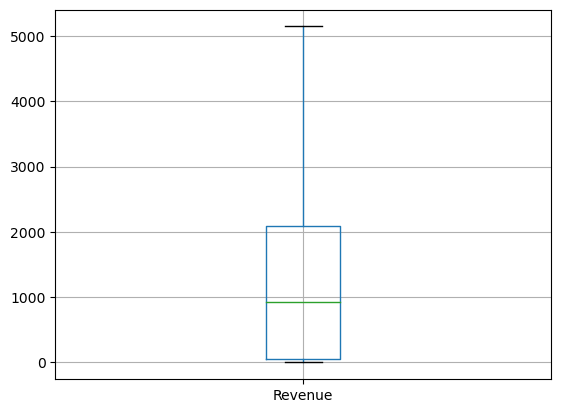

The description statistics for 'CTR' column is:


count    23066.000000
mean         8.223203
std          8.253522
min          0.010874
25%          0.265107
50%          9.391248
75%         13.470571
max         33.278766
Name: CTR, dtype: float64


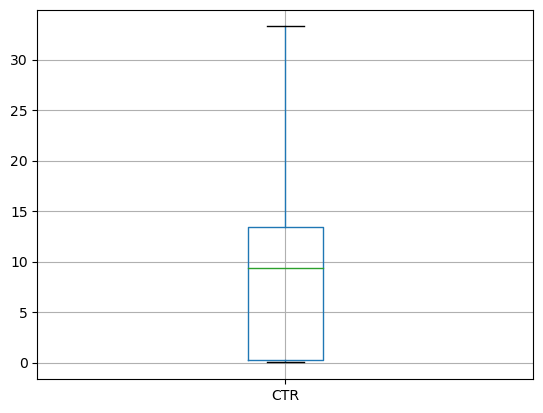

The description statistics for 'CPM' column is:


count    23066.000000
mean         8.219181
std          6.881016
min          0.000000
25%          1.749084
50%          8.371566
75%         13.042018
max         29.981418
Name: CPM, dtype: float64


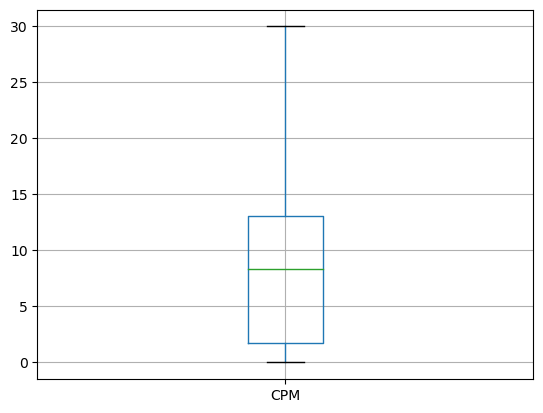

The description statistics for 'CPC' column is:


count    23066.000000
mean         0.330035
std          0.316568
min          0.000000
25%          0.089736
50%          0.139347
75%          0.546242
max          1.231002
Name: CPC, dtype: float64


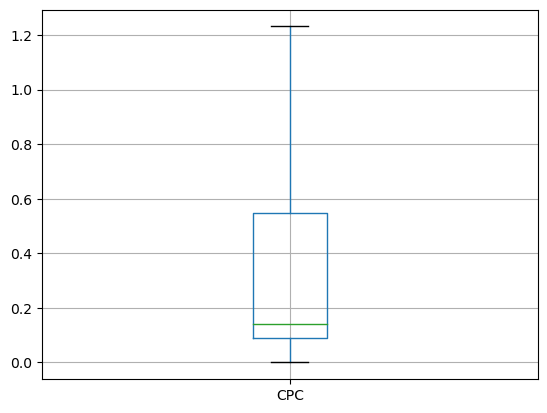

In [123]:
for i in range(0,13):
    print("The description statistics for '{}' column is:".format(lstnumericcolumns[i]))
    print('\n')
    print(numdata[lstnumericcolumns[i]].describe())
    numdata.boxplot(column=lstnumericcolumns[i])
    plt.show()

In [124]:
def treat_outlier(x):
    # taking 5,25,75 percentile of column
    q5= np.percentile(x,5)
    q25=np.percentile(x,25)
    q75=np.percentile(x,75)
    q95=np.percentile(x,95)
    #calculationg IQR range
    IQR=q75-q25
    #Calculating minimum threshold
    lower_bound=q25-(1.5*IQR)
    upper_bound=q75+(1.5*IQR)
    #Capping outliers
    return x.apply(lambda y: q95 if y > q95 else y).apply(lambda y: q5 if y < q5 else y)

In [125]:
Q1 = numdata.quantile(0.25)
Q3 = numdata.quantile(0.75)
IQR = Q3 - Q1

In [126]:
((numdata < (Q1 - 1.5 * IQR)) | (numdata > (Q3 + 1.5 * IQR))).sum()

Ad - Length              0
Ad- Width                0
Ad Size                  0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
dtype: int64

In [127]:
((numdata > (Q3 + 1.5 * IQR)) & (numdata < df_num.quantile(0.95))).sum()

Ad - Length              0
Ad- Width                0
Ad Size                  0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
dtype: int64

In [128]:
no_outlier = ['Ad - Length','Ad- Width']

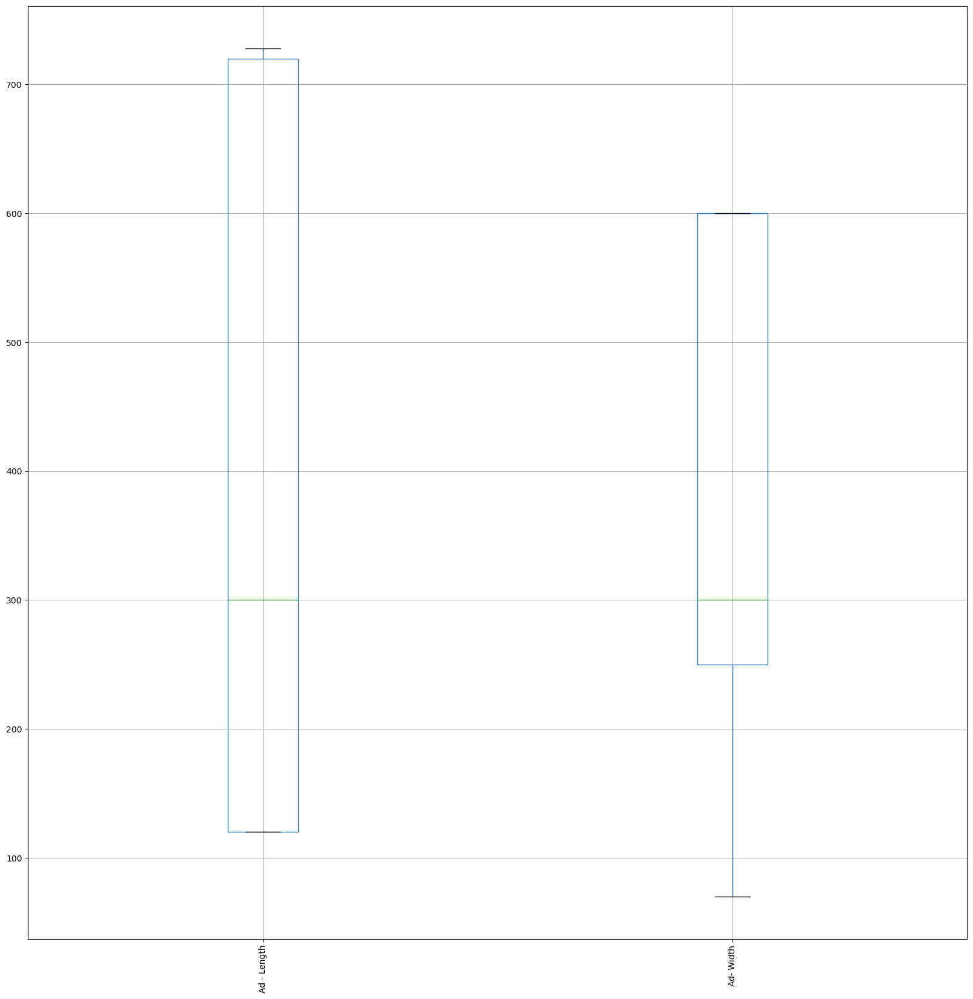

In [129]:
numdata[no_outlier].boxplot(figsize=(20,20))
plt.xticks(rotation=90)
plt.show()

In [130]:
def treat_outlier(x):
    # taking 5,25,75 percentile of column
    q5= np.percentile(x,5)
    q25=np.percentile(x,25)
    q75=np.percentile(x,75)
    q95=np.percentile(x,95)
    #calculationg IQR range
    IQR=q75-q25
    #Calculating minimum threshold
    lower_bound=q25-(1.5*IQR)
    upper_bound=q75+(1.5*IQR)
    #Capping outliers
    return x.apply(lambda y: q95 if y > q95 else y).apply(lambda y: q5 if y < q5 else y)

In [131]:
outlier_list = [x for x in numdata.columns if x not in no_outlier]

In [132]:
for i in numdata[outlier_list]:    
    numdata[i]=treat_outlier(numdata[i])

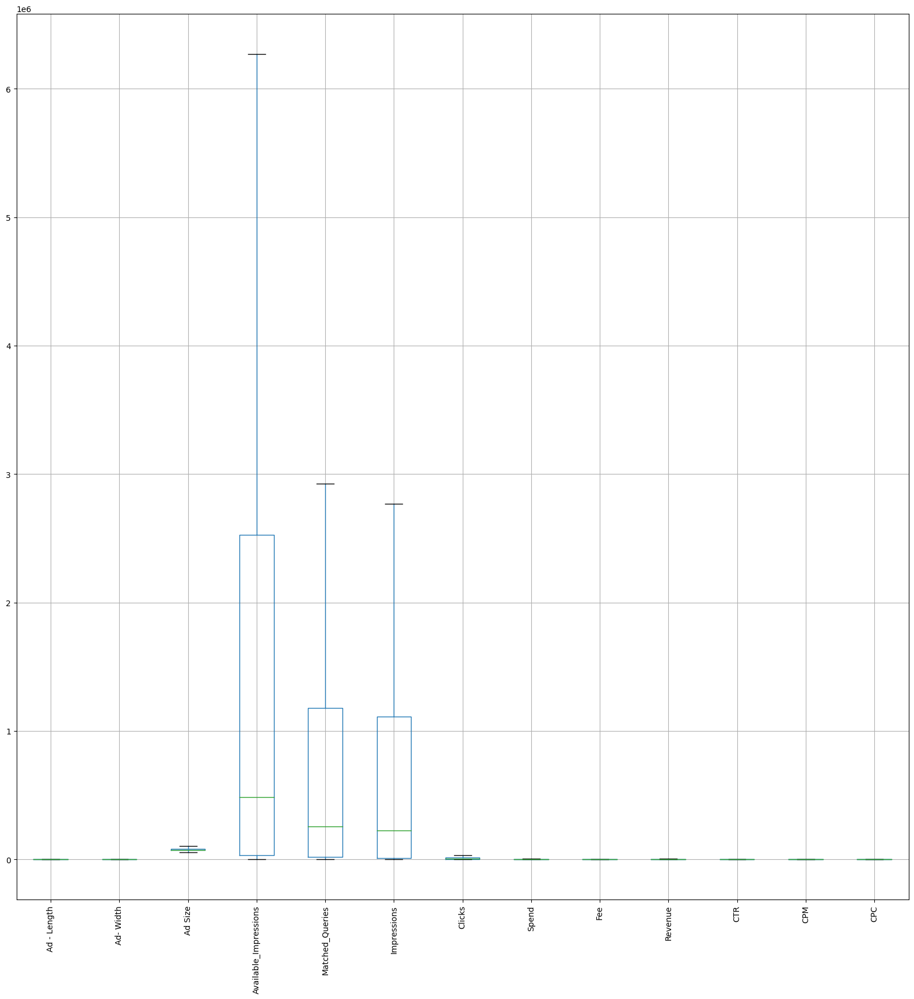

In [133]:
numdata.boxplot(figsize=(20,20))
plt.xticks(rotation=90)
plt.show()

In [134]:
numdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Ad - Length            23066 non-null  float64
 1   Ad- Width              23066 non-null  float64
 2   Ad Size                23066 non-null  float64
 3   Available_Impressions  23066 non-null  float64
 4   Matched_Queries        23066 non-null  float64
 5   Impressions            23066 non-null  float64
 6   Clicks                 23066 non-null  float64
 7   Spend                  23066 non-null  float64
 8   Fee                    23066 non-null  float64
 9   Revenue                23066 non-null  float64
 10  CTR                    23066 non-null  float64
 11  CPM                    23066 non-null  float64
 12  CPC                    23066 non-null  float64
dtypes: float64(13)
memory usage: 2.3 MB


In [135]:
from scipy.stats import zscore
numdata_scaled=numdata.apply(zscore)
numdata_scaled.head().T

,0,1,2,3,4
Ad - Length,-0.364496,-0.364496,-0.364496,-0.364496,-0.364496
Ad- Width,-0.432797,-0.432797,-0.432797,-0.432797,-0.432797
Ad Size,-0.102518,-0.102518,-0.102518,-0.102518,-0.102518
Available_Impressions,-0.755347,-0.755359,-0.754914,-0.755053,-0.755624
Matched_Queries,-0.778958,-0.778997,-0.778928,-0.778791,-0.779039
Impressions,-0.768487,-0.768525,-0.768454,-0.768311,-0.768569
Clicks,-0.866322,-0.866322,-0.866322,-0.866322,-0.866322
Spend,-0.892774,-0.892774,-0.892774,-0.892774,-0.892774
Fee,0.535724,0.535724,0.535724,0.535724,0.535724
Revenue,-0.879713,-0.879713,-0.879713,-0.879713,-0.879713


In [137]:
numdata_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Ad - Length            23066 non-null  float64
 1   Ad- Width              23066 non-null  float64
 2   Ad Size                23066 non-null  float64
 3   Available_Impressions  23066 non-null  float64
 4   Matched_Queries        23066 non-null  float64
 5   Impressions            23066 non-null  float64
 6   Clicks                 23066 non-null  float64
 7   Spend                  23066 non-null  float64
 8   Fee                    23066 non-null  float64
 9   Revenue                23066 non-null  float64
 10  CTR                    23066 non-null  float64
 11  CPM                    23066 non-null  float64
 12  CPC                    23066 non-null  float64
dtypes: float64(13)
memory usage: 2.3 MB


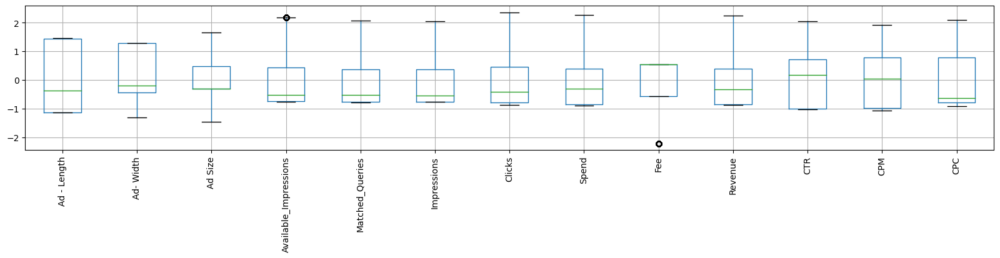

In [136]:
numdata_scaled.boxplot(figsize=(20,3))
plt.xticks(rotation=90)
plt.show()

In [138]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [148]:
wardlink=linkage(numdata_scaled,method ='ward')

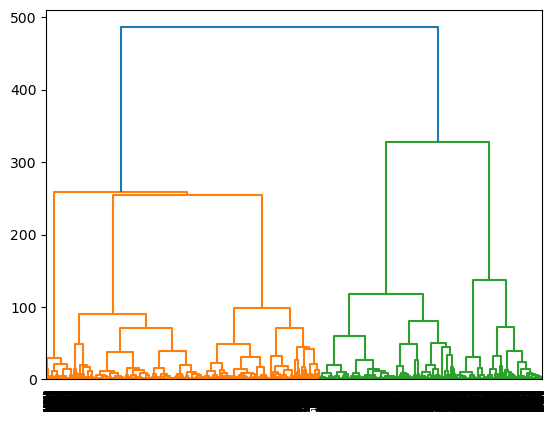

In [149]:
dend=dendrogram(wardlink)

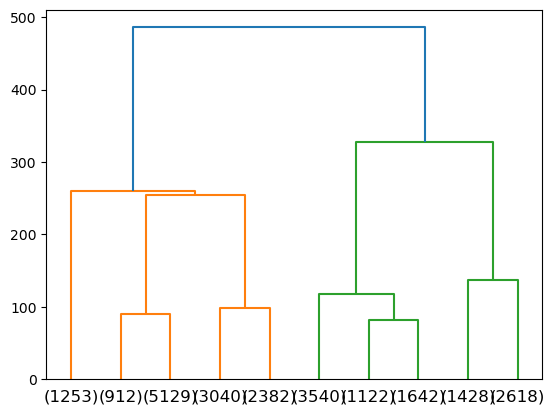

In [150]:
dend = dendrogram(wardlink,
                 truncate_mode='lastp',
                 p = 10,
                 )

In [151]:
from scipy.cluster.hierarchy import fcluster

In [168]:
clusters = fcluster(wardlink, 5, criterion='maxclust')
clusters

array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4,
       4, 3, 4, 3, 4, 4, 3, 4, 3, 3, 4, 3, 4, 4, 3, 3, 4, 2, 4, 4, 4, 3,
       4, 3, 4, 3, 3, 3, 2, 4, 2, 2, 2, 2, 3, 3, 2, 3, 2, 4, 3, 3, 4, 3,
       4, 3, 4, 3, 3, 4, 2, 4, 4, 4, 3, 2, 4, 2, 2, 3, 4, 4, 3, 3, 3, 2,
       4, 2, 3, 2, 4, 2, 2, 2, 4, 2, 3, 2, 2, 3, 3, 2, 2, 3, 4, 2, 3, 2,
       2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 4, 2, 2, 4, 2, 4, 3, 2, 2, 2, 3,
       3, 3, 2, 4, 3, 2, 2, 3, 4, 3, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 3,
       3, 3, 4, 2, 2, 2, 3, 4, 3, 4, 3, 4, 3, 2, 2,

In [167]:
from sklearn.preprocessing import StandardScaler
X = StandardScaler()
scaled_df = X.fit_transform(numdata)
scaled_df

array([[-3.64495702e-01, -4.32796761e-01, -1.02518463e-01,
        -7.55346894e-01, -7.78958474e-01, -7.68486628e-01,
        -8.66321755e-01, -8.92773708e-01,  5.35724395e-01,
        -8.79713446e-01, -9.99543123e-01, -1.06731500e+00,
        -9.08580807e-01, -2.35054153e+00],
       [-3.64495702e-01, -4.32796761e-01, -1.02518463e-01,
        -7.55359127e-01, -7.78997460e-01, -7.68525395e-01,
        -8.66321755e-01, -8.92773708e-01,  5.35724395e-01,
        -8.79713446e-01, -9.94171190e-01, -1.06731500e+00,
        -9.08580807e-01, -2.35488446e+00],
       [-3.64495702e-01, -4.32796761e-01, -1.02518463e-01,
        -7.54913578e-01, -7.78928260e-01, -7.68453983e-01,
        -8.66321755e-01, -8.92773708e-01,  5.35724395e-01,
        -8.79713446e-01, -1.00317485e+00, -1.06731500e+00,
        -9.08580807e-01, -2.34744556e+00],
       [-3.64495702e-01, -4.32796761e-01, -1.02518463e-01,
        -7.55053312e-01, -7.78790834e-01, -7.68311159e-01,
        -8.66321755e-01, -8.92773708e-01,  5.

In [154]:
k_means = KMeans(n_clusters = 5)

In [155]:
k_means.fit(scaled_df)

C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=5)

In [175]:
k_means.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1,
       1, 3, 1, 3, 1, 1, 3, 1, 3, 3, 1, 3, 1, 1, 3, 3, 1, 0, 1, 1, 1, 3,
       1, 3, 1, 3, 3, 3, 0, 1, 0, 0, 0, 0, 3, 3, 0, 3, 0, 1, 3, 3, 1, 3,
       1, 3, 1, 3, 3, 1, 0, 1, 1, 1, 3, 0, 1, 0, 0, 3, 1, 1, 3, 3, 3, 0,
       1, 0, 3, 0, 3, 0, 0, 0, 1, 0, 3, 0, 0, 3, 3, 0, 0, 3, 1, 0, 3, 0,
       0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 3, 0, 0, 0, 3,
       3, 3, 0, 1, 3, 0, 0, 3, 3, 3, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 3,
       3, 3, 1, 0, 0, 0, 3, 1, 3, 1, 3, 1, 3, 0, 0,

In [160]:
k_means.inertia_

77750.00641097719

In [163]:
wss=[]
a=[1,2,3,4,5,6,7,8,9,10]
sil_score=[]
for i in a:
        KM=KMeans(n_clusters=i,random_state=1)
        KM.fit(scaled_df)
        wss.append(KM.inertia_)

C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. 

In [164]:
wss

[322924.0,
 202179.4351898643,
 148996.75114258018,
 112314.15876227134,
 77747.23923187575,
 64973.61874332653,
 53190.16827930424,
 46233.055962827115,
 41317.55350736825,
 38394.427948061966]

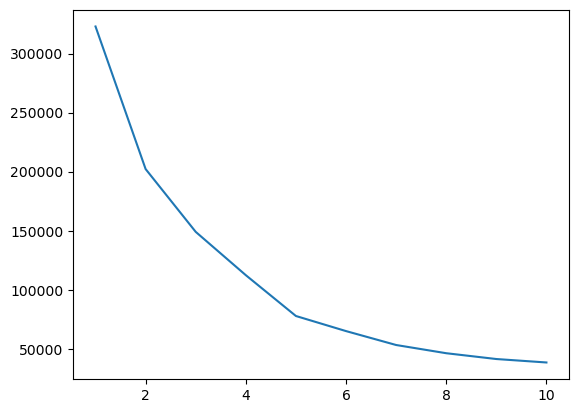

In [165]:
plt.plot(range(1,11), wss)

In [169]:
k_means = KMeans(n_clusters = 5)
k_means.fit(scaled_df)
labels = k_means.labels_

C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [170]:
df["Clus_kmeans"] = labels
df.head(5)

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC,Clus_kmeans
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.309598,0.0,0.0,1
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.350877,0.0,0.0,1
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.281690,0.0,0.0,1
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.202020,0.0,0.0,1
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.413223,0.0,0.0,1


In [181]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [182]:
silhouette_score(scaled_df,labels)

0.5017872146494867

In [183]:
sil_width = silhouette_samples(scaled_df,labels)

In [186]:
df["sil_width"] = sil_width
df.head(5).T

,0,1,2,3,4
Timestamp,2020-9-2-17,2020-9-2-10,2020-9-1-22,2020-9-3-20,2020-9-4-15
InventoryType,Format1,Format1,Format1,Format1,Format1
Ad - Length,300,300,300,300,300
Ad- Width,250,250,250,250,250
Ad Size,75000,75000,75000,75000,75000
Ad Type,Inter222,Inter227,Inter222,Inter228,Inter217
Platform,Video,App,Video,Video,Web
Device Type,Desktop,Mobile,Desktop,Mobile,Desktop
Format,Display,Video,Display,Video,Video
Available_Impressions,1806,1780,2727,2430,1218


In [176]:
ss={1:0}
for i in range(2,11):
    clusterer=KMeans(n_clusters=i,init="k-means++",random_state=1)
    y=clusterer.fit_predict(scaled_df)
    s=silhouette_score(scaled_df,y)
    ss[i]=round(s,5)
    print("Average silhouette_score for {} clusters is {}".format(i,round(s,5)))

C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Average silhouette_score for 2 clusters is 0.37252


C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Average silhouette_score for 3 clusters is 0.37004


C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Average silhouette_score for 4 clusters is 0.42886


C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Average silhouette_score for 5 clusters is 0.50181


C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Average silhouette_score for 6 clusters is 0.53496


C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Average silhouette_score for 7 clusters is 0.52621


C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Average silhouette_score for 8 clusters is 0.52892


C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Average silhouette_score for 9 clusters is 0.51088


C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Average silhouette_score for 10 clusters is 0.4521


In [177]:
df["Clus_kmeans"].unique()

array([1, 3, 0, 2, 4])

In [178]:
df["Clus_kmeans"].value_counts()

Clus_kmeans
1    6242
0    5827
3    5467
2    4039
4    1491
Name: count, dtype: int64

In [179]:
final_df =df.drop(['Timestamp','InventoryType','Ad Type','Platform','Device Type','Format'], axis=1)

In [180]:
clust_profile=final_df
clust_profile=clust_profile.groupby('Clus_kmeans').mean()
clust_profile['freq']=final_df.Clus_kmeans.value_counts().sort_index()
np.round(clust_profile,2).T

Clus_kmeans,0,1,2,3,4
Ad - Length,120.71,422.55,466.08,631.74,138.86
Ad- Width,600.00,148.66,199.08,312.14,576.29
Ad Size,72426.29,54074.34,75184.26,192851.66,75348.09
Available_Impressions,32365.93,1815118.65,10413336.84,237633.11,818473.93
Matched_Queries,20312.82,867909.95,5639488.80,128166.47,575666.51
Impressions,14046.91,829888.91,5460509.01,108991.71,485592.06
Clicks,2061.01,3260.07,11271.57,12717.77,66329.94
Spend,228.45,1506.24,8666.32,1118.23,7096.74
Fee,0.35,0.35,0.29,0.35,0.29
Revenue,148.76,981.58,6389.03,728.51,5099.19


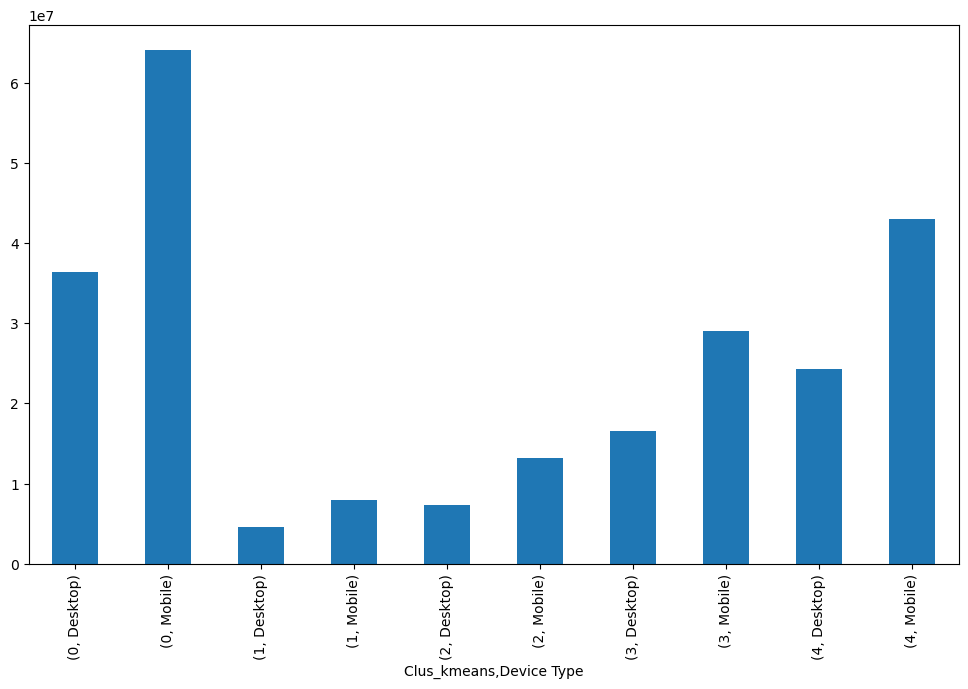

In [77]:
df.groupby(['Clus_kmeans','Device Type']).sum()['Clicks'].plot(kind='bar',figsize=(12,7));


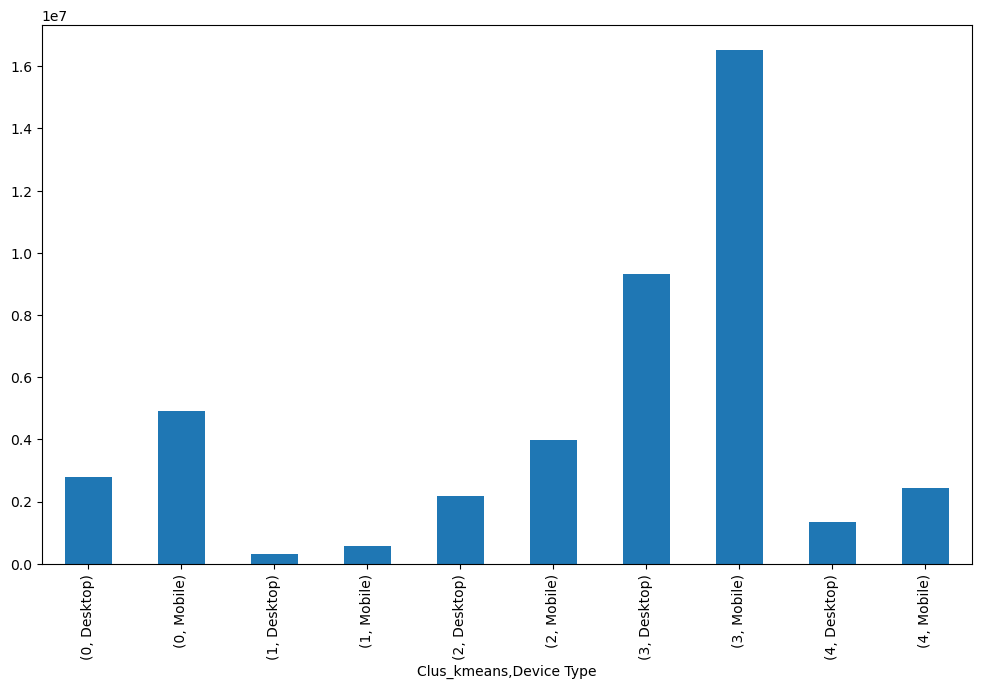

In [78]:
df.groupby(['Clus_kmeans','Device Type']).sum()['Revenue'].plot(kind='bar',figsize=(12,7));

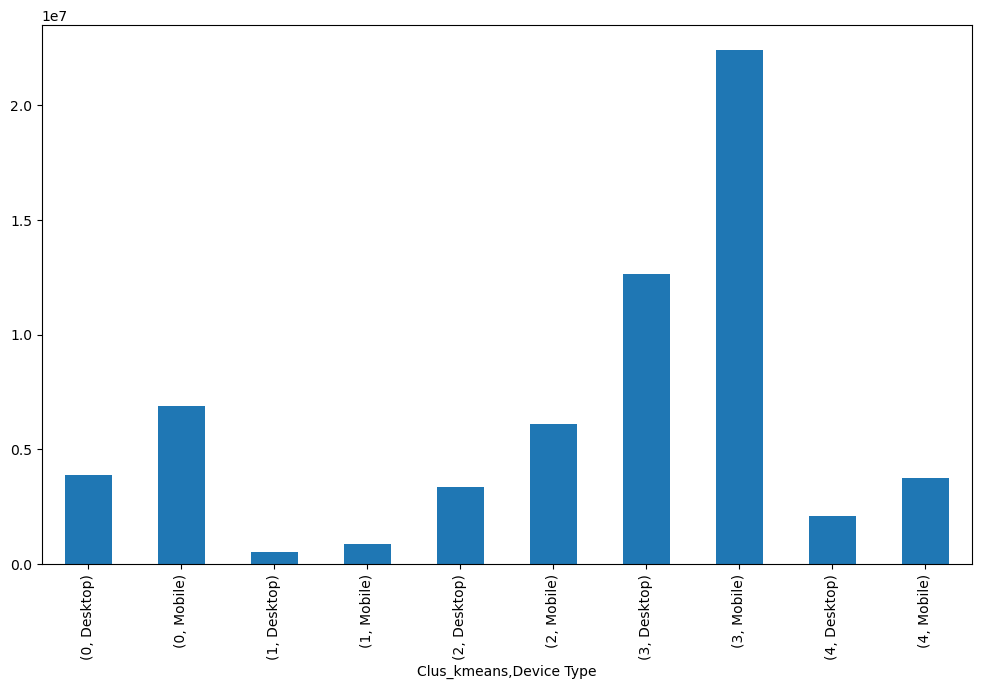

In [79]:
df.groupby(['Clus_kmeans','Device Type']).sum()['Spend'].plot(kind='bar',figsize=(12,7));

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans 
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
%matplotlib inline

In [2]:
import sys
pd.set_option('display.max_rows',None)


In [3]:
%pip install xlrd 
df1=pd.read_excel('PCA+India+Data_Census.xlsx')

Note: you may need to restart the kernel to use updated packages.


In [4]:
pd.set_option('display.max_rows',100)

In [5]:
df1.drop(['State Code'], axis=1, inplace=True)

In [6]:
df1.drop(['Dist.Code'], axis=1, inplace=True)

In [7]:
df1.head().T

,0,1,2,3,4
State,Jammu & Kashmir,Jammu & Kashmir,Jammu & Kashmir,Jammu & Kashmir,Jammu & Kashmir
Area Name,Kupwara,Badgam,Leh(Ladakh),Kargil,Punch
No_HH,7707,6218,4452,1320,11654
TOT_M,23388,19585,6546,2784,20591
TOT_F,29796,23102,10964,4206,29981
M_06,5862,4482,1082,563,5157
F_06,6196,3733,1018,677,4587
M_SC,3,7,3,0,20
F_SC,0,6,6,0,33
M_ST,1999,427,5806,2666,7670


In [8]:
df1.tail().T

,635,636,637,638,639
State,Puducherry,Puducherry,Andaman & Nicobar Island,Andaman & Nicobar Island,Andaman & Nicobar Island
Area Name,Mahe,Karaikal,Nicobars,North & Middle Andaman,South Andaman
No_HH,3333,10612,1275,3762,7975
TOT_M,8154,12346,1549,5200,11977
TOT_F,11781,21691,2630,8012,18049
M_06,1146,1544,227,723,1470
F_06,1203,1533,225,664,1358
M_SC,21,2234,0,0,0
F_SC,30,4155,0,0,0
M_ST,0,0,1012,28,161


In [9]:
df1.shape

(640, 59)

In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 59 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State           640 non-null    object
 1   Area Name       640 non-null    object
 2   No_HH           640 non-null    int64 
 3   TOT_M           640 non-null    int64 
 4   TOT_F           640 non-null    int64 
 5   M_06            640 non-null    int64 
 6   F_06            640 non-null    int64 
 7   M_SC            640 non-null    int64 
 8   F_SC            640 non-null    int64 
 9   M_ST            640 non-null    int64 
 10  F_ST            640 non-null    int64 
 11  M_LIT           640 non-null    int64 
 12  F_LIT           640 non-null    int64 
 13  M_ILL           640 non-null    int64 
 14  F_ILL           640 non-null    int64 
 15  TOT_WORK_M      640 non-null    int64 
 16  TOT_WORK_F      640 non-null    int64 
 17  MAINWORK_M      640 non-null    int64 
 18  MAINWORK_F

In [11]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
No_HH,640.0,51222.871875,48135.405475,350.0,19484.00,35837.0,68892.00,310450.0
TOT_M,640.0,79940.576563,73384.511114,391.0,30228.00,58339.0,107918.50,485417.0
TOT_F,640.0,122372.084375,113600.717282,698.0,46517.75,87724.5,164251.75,750392.0
M_06,640.0,12309.098438,11500.906881,56.0,4733.75,9159.0,16520.25,96223.0
F_06,640.0,11942.300000,11326.294567,56.0,4672.25,8663.0,15902.25,95129.0
M_SC,640.0,13820.946875,14426.373130,0.0,3466.25,9591.5,19429.75,103307.0
F_SC,640.0,20778.392188,21727.887713,0.0,5603.25,13709.0,29180.00,156429.0
M_ST,640.0,6191.807813,9912.668948,0.0,293.75,2333.5,7658.00,96785.0
F_ST,640.0,10155.640625,15875.701488,0.0,429.50,3834.5,12480.25,130119.0
M_LIT,640.0,57967.979688,55910.282466,286.0,21298.00,42693.5,77989.50,403261.0


In [12]:
df1.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
635    False
636    False
637    False
638    False
639    False
Length: 640, dtype: bool

In [13]:
df1.isnull().sum()

State             0
Area Name         0
No_HH             0
TOT_M             0
TOT_F             0
M_06              0
F_06              0
M_SC              0
F_SC              0
M_ST              0
F_ST              0
M_LIT             0
F_LIT             0
M_ILL             0
F_ILL             0
TOT_WORK_M        0
TOT_WORK_F        0
MAINWORK_M        0
MAINWORK_F        0
MAIN_CL_M         0
MAIN_CL_F         0
MAIN_AL_M         0
MAIN_AL_F         0
MAIN_HH_M         0
MAIN_HH_F         0
MAIN_OT_M         0
MAIN_OT_F         0
MARGWORK_M        0
MARGWORK_F        0
MARG_CL_M         0
MARG_CL_F         0
MARG_AL_M         0
MARG_AL_F         0
MARG_HH_M         0
MARG_HH_F         0
MARG_OT_M         0
MARG_OT_F         0
MARGWORK_3_6_M    0
MARGWORK_3_6_F    0
MARG_CL_3_6_M     0
MARG_CL_3_6_F     0
MARG_AL_3_6_M     0
MARG_AL_3_6_F     0
MARG_HH_3_6_M     0
MARG_HH_3_6_F     0
MARG_OT_3_6_M     0
MARG_OT_3_6_F     0
MARGWORK_0_3_M    0
MARGWORK_0_3_F    0
MARG_CL_0_3_M     0


In [15]:
df1_num = df1.select_dtypes(include = ['int64'])
lstnumericcolumns = list(df1_num.columns.values)
len(lstnumericcolumns)


57

In [16]:
def univariateAnalysis_numeric_basic(column,nbins):
    print("Description of " + column)
    print("----------------------------------------------------------------------------")
    print(df1[column].describe(),end=' ')
    
    
    plt.figure()
    print("Distribution of " + column)
    print("----------------------------------------------------------------------------")
    sns.distplot(df1[column], kde=True, color='g',bins=nbins);
    plt.show()
    
    plt.figure()
    print("BoxPlot of " + column)
    print("----------------------------------------------------------------------------")
    ax = sns.boxplot(x=df1[column])
    plt.show()

Description of No_HH
----------------------------------------------------------------------------
count       640.000000
mean      51222.871875
std       48135.405475
min         350.000000
25%       19484.000000
50%       35837.000000
75%       68892.000000
max      310450.000000
Name: No_HH, dtype: float64 Distribution of No_HH
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_8704\1248611364.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1[column], kde=True, color='g',bins=nbins);


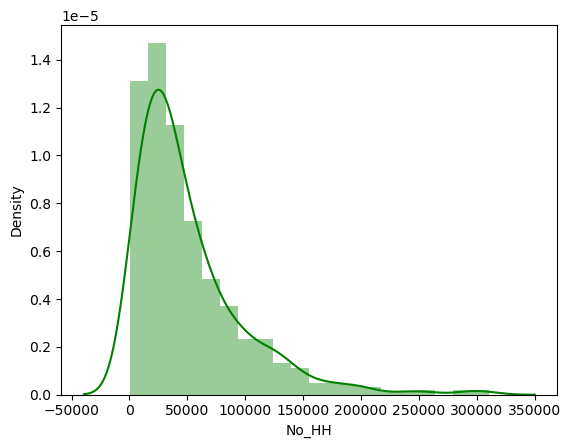

BoxPlot of No_HH
----------------------------------------------------------------------------


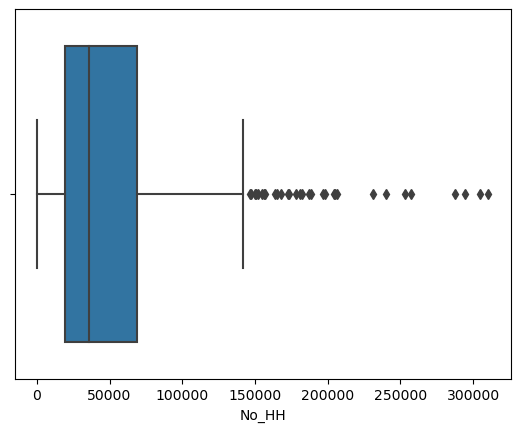

Description of TOT_M
----------------------------------------------------------------------------
count       640.000000
mean      79940.576563
std       73384.511114
min         391.000000
25%       30228.000000
50%       58339.000000
75%      107918.500000
max      485417.000000
Name: TOT_M, dtype: float64 Distribution of TOT_M
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_8704\1248611364.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1[column], kde=True, color='g',bins=nbins);


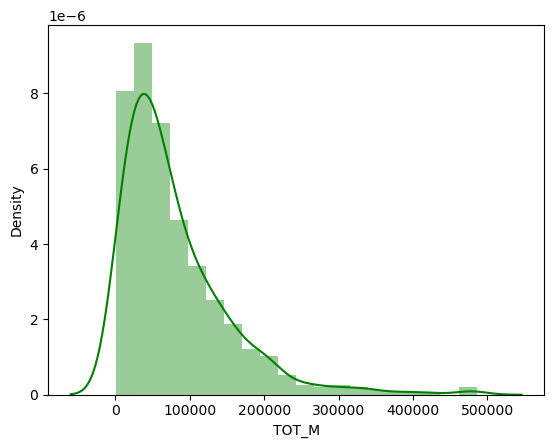

BoxPlot of TOT_M
----------------------------------------------------------------------------


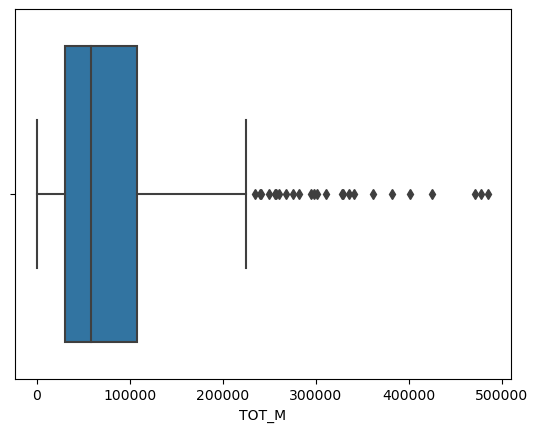

Description of TOT_F
----------------------------------------------------------------------------
count       640.000000
mean     122372.084375
std      113600.717282
min         698.000000
25%       46517.750000
50%       87724.500000
75%      164251.750000
max      750392.000000
Name: TOT_F, dtype: float64 Distribution of TOT_F
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_8704\1248611364.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1[column], kde=True, color='g',bins=nbins);


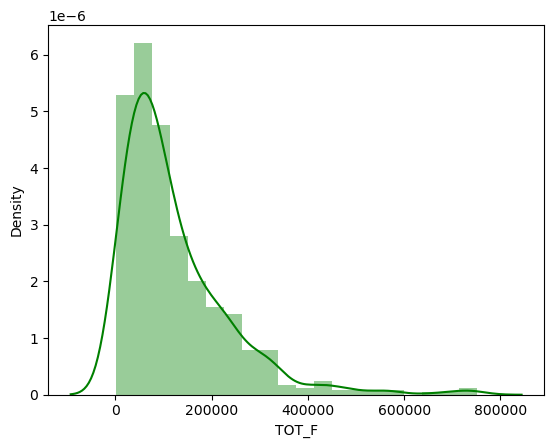

BoxPlot of TOT_F
----------------------------------------------------------------------------


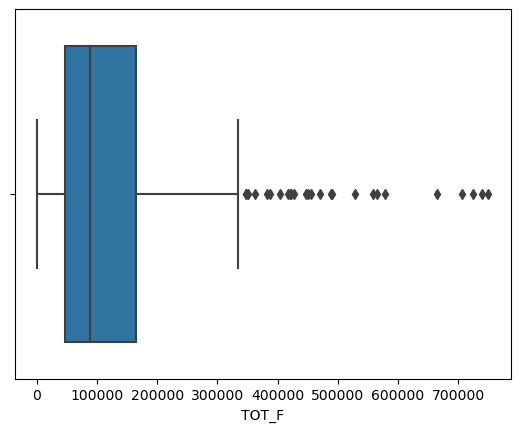

Description of TOT_WORK_M
----------------------------------------------------------------------------
count       640.000000
mean      37992.407813
std       36419.537491
min         100.000000
25%       13753.500000
50%       27936.500000
75%       50226.750000
max      269422.000000
Name: TOT_WORK_M, dtype: float64 Distribution of TOT_WORK_M
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_8704\1248611364.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1[column], kde=True, color='g',bins=nbins);


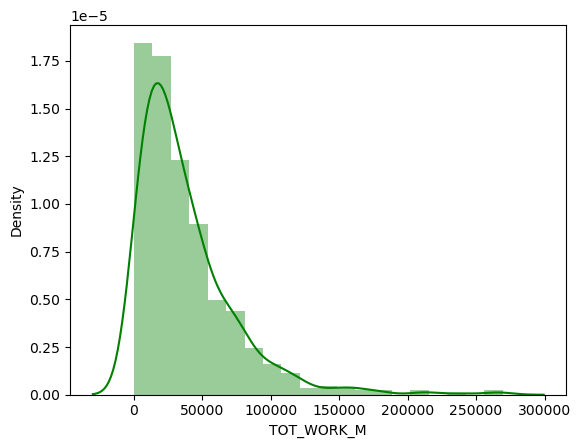

BoxPlot of TOT_WORK_M
----------------------------------------------------------------------------


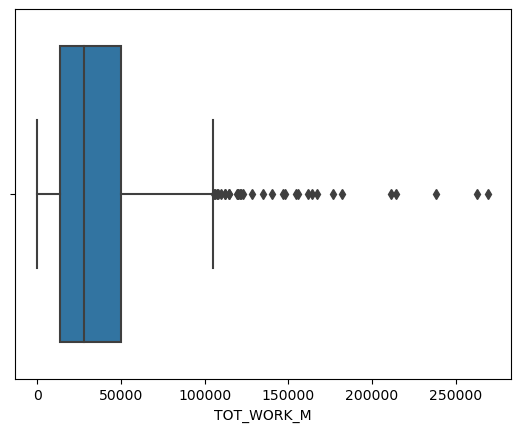

Description of TOT_WORK_F
----------------------------------------------------------------------------
count       640.000000
mean      41295.760938
std       37192.360943
min         357.000000
25%       16097.750000
50%       30588.500000
75%       53234.250000
max      257848.000000
Name: TOT_WORK_F, dtype: float64 Distribution of TOT_WORK_F
----------------------------------------------------------------------------


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_8704\1248611364.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1[column], kde=True, color='g',bins=nbins);


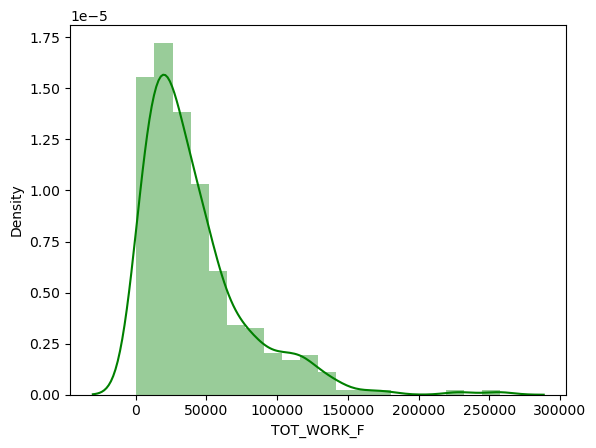

BoxPlot of TOT_WORK_F
----------------------------------------------------------------------------


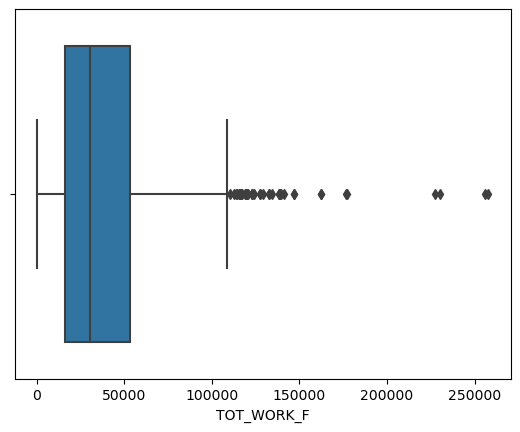

In [17]:
univariateAnalysis_numeric_basic('No_HH',20)
univariateAnalysis_numeric_basic('TOT_M',20)
univariateAnalysis_numeric_basic('TOT_F',20)
univariateAnalysis_numeric_basic('TOT_WORK_M',20)
univariateAnalysis_numeric_basic('TOT_WORK_F',20)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


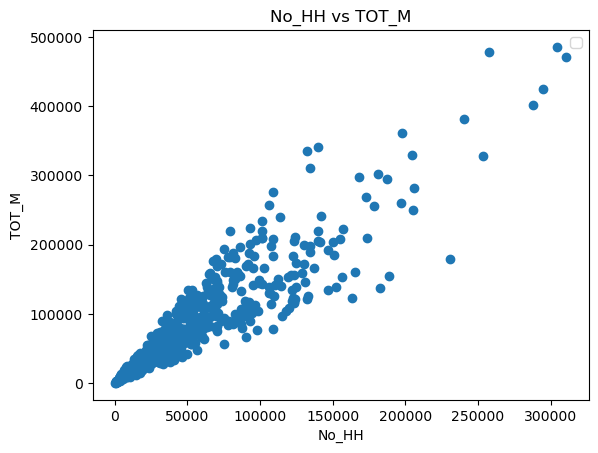

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


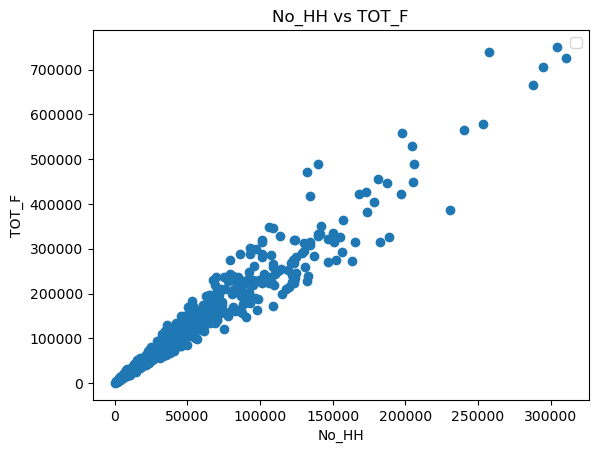

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


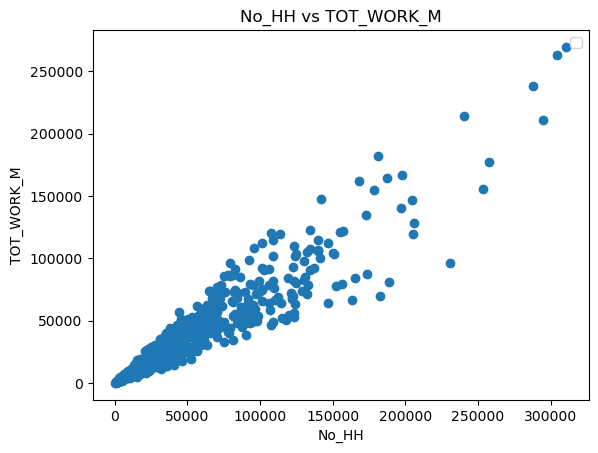

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


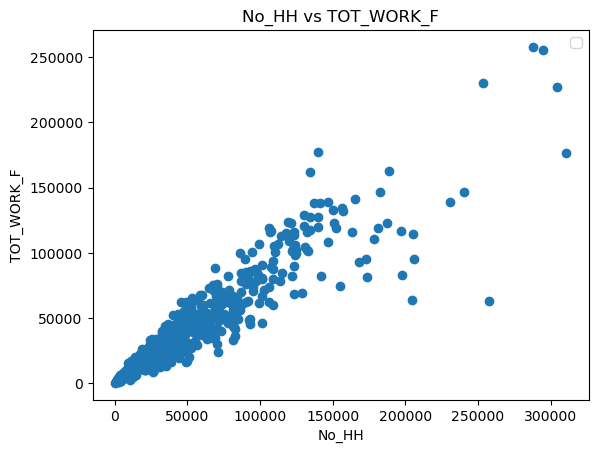

In [18]:
x_col = "No_HH"
y_columns = ["TOT_M", "TOT_F", "TOT_WORK_M","TOT_WORK_F"]


for y_col in y_columns:

    figure = plt.figure
    ax = plt.gca()
    ax.scatter(df1[x_col],df1[y_col])
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_title("{} vs {}".format(x_col, y_col))

    plt.legend()
    plt.show()

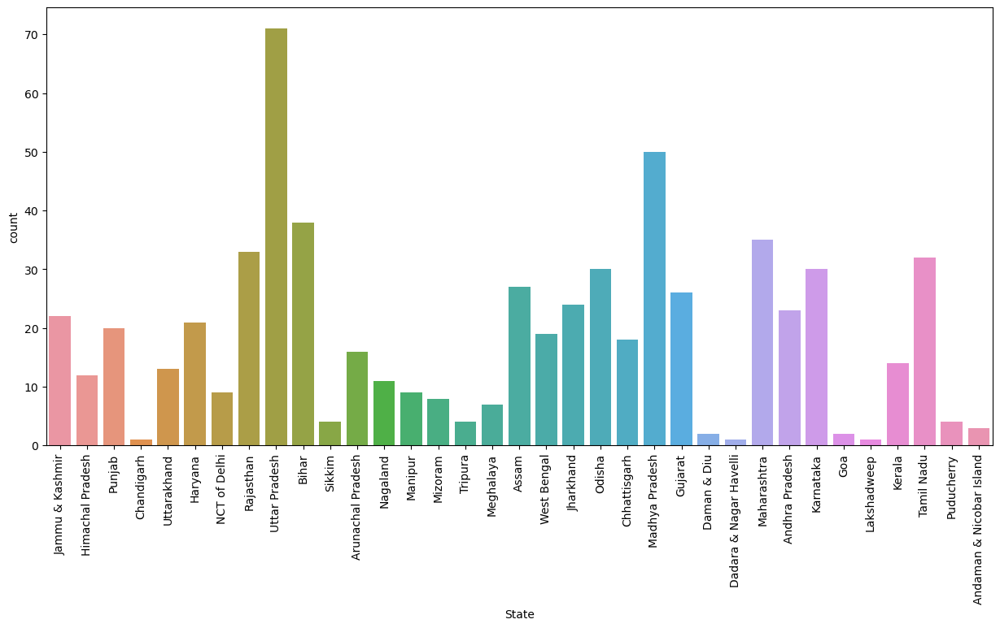

In [19]:
plt.figure(figsize=(15,7))
sns.countplot(data=df1,x='State');
plt.xticks(rotation=90);

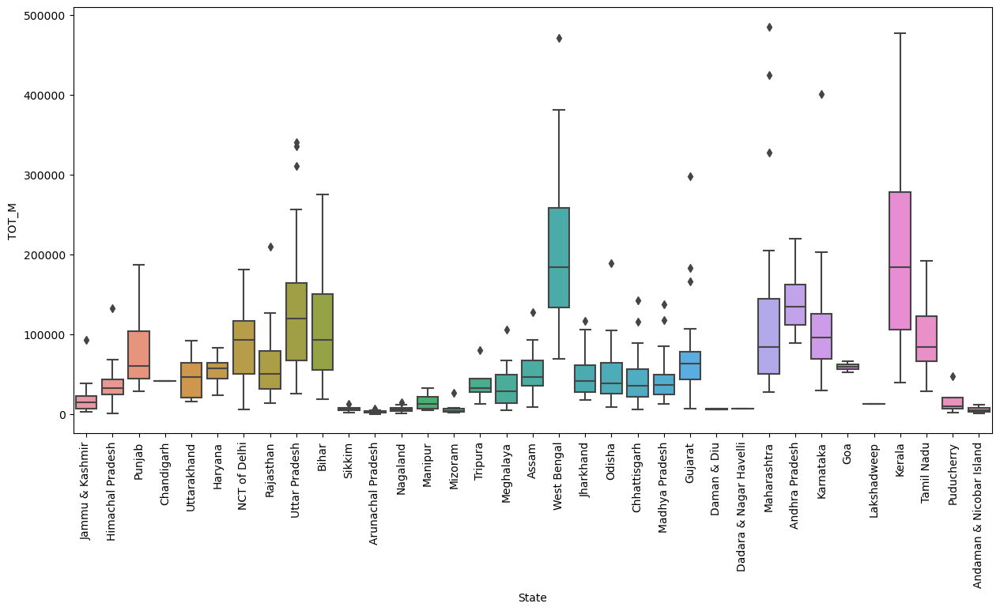

In [20]:
plt.figure(figsize=(15,7))
sns.boxplot(x='State',y='TOT_M',data=df1)
plt.xticks(rotation=90);

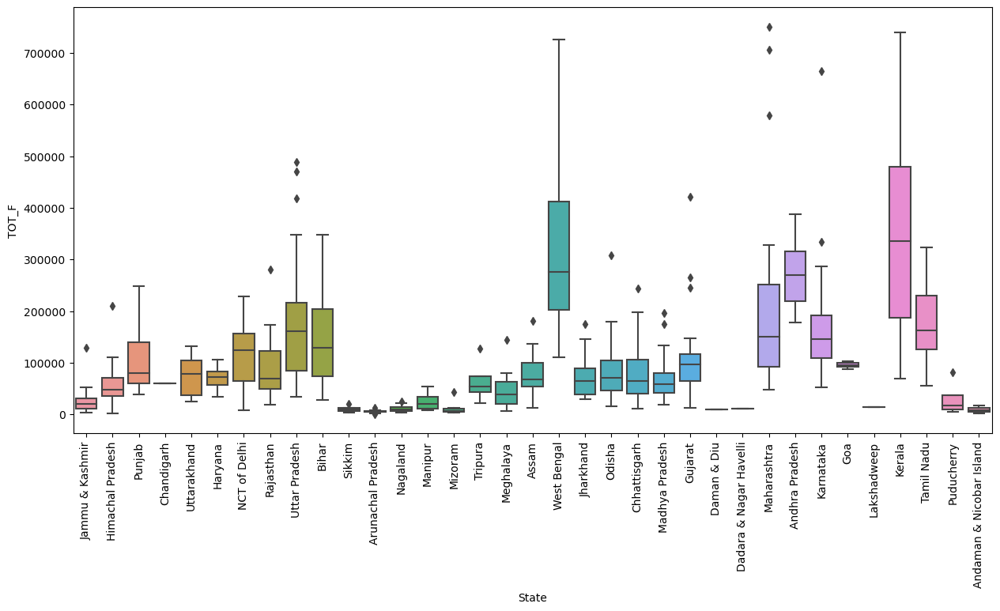

In [21]:
plt.figure(figsize=(15,7))
sns.boxplot(x='State',y='TOT_F',data=df1)
plt.xticks(rotation=90);

In [22]:
df1['State'].value_counts().max()

71

In [23]:
df1['State'].value_counts()

State
Uttar Pradesh               71
Madhya Pradesh              50
Bihar                       38
Maharashtra                 35
Rajasthan                   33
Tamil Nadu                  32
Karnataka                   30
Odisha                      30
Assam                       27
Gujarat                     26
Jharkhand                   24
Andhra Pradesh              23
Jammu & Kashmir             22
Haryana                     21
Punjab                      20
West Bengal                 19
Chhattisgarh                18
Arunachal Pradesh           16
Kerala                      14
Uttarakhand                 13
Himachal Pradesh            12
Nagaland                    11
Manipur                      9
NCT of Delhi                 9
Mizoram                      8
Meghalaya                    7
Tripura                      4
Sikkim                       4
Puducherry                   4
Andaman & Nicobar Island     3
Goa                          2
Daman & Diu                  2
La

In [24]:
df1.groupby(['State'])['TOT_M'].sum().sort_values(ascending=False)

State
Uttar Pradesh               9043969
Maharashtra                 4196130
Bihar                       4025198
West Bengal                 3912553
Karnataka                   3409482
Andhra Pradesh              3274363
Tamil Nadu                  3074009
Kerala                      2919825
Madhya Pradesh              2155608
Rajasthan                   2062563
Gujarat                     1983685
Punjab                      1579405
Odisha                      1460031
Assam                       1437268
Jharkhand                   1202623
Haryana                     1167816
Chhattisgarh                 838404
NCT of Delhi                 833414
Uttarakhand                  613924
Himachal Pradesh             483381
Jammu & Kashmir              421213
Meghalaya                    268036
Tripura                      160457
Manipur                      145524
Goa                          118979
Nagaland                      73506
Puducherry                    70386
Mizoram               

In [25]:
df1.groupby(['State'])['TOT_F'].sum().sort_values(ascending=False)

State
Uttar Pradesh               12023885
Maharashtra                  7138557
Andhra Pradesh               6097235
West Bengal                  6016118
Tamil Nadu                   5610310
Bihar                        5405883
Karnataka                    5345675
Kerala                       4856357
Madhya Pradesh               3369745
Rajasthan                    2966496
Gujarat                      2939472
Odisha                       2536980
Punjab                       2121425
Assam                        2093432
Jharkhand                    1763884
Chhattisgarh                 1526592
Haryana                      1498873
NCT of Delhi                 1075266
Uttarakhand                   973147
Himachal Pradesh              752062
Jammu & Kashmir               572959
Meghalaya                     356355
Tripura                       256370
Manipur                       226963
Goa                           191393
Nagaland                      125935
Puducherry                    11

In [26]:
df1.groupby(['State']).TOT_M.value_counts()

State                     TOT_M 
Andaman & Nicobar Island  1549      1
                          5200      1
                          11977     1
Andhra Pradesh            198011    1
                          204287    1
                                   ..
West Bengal               294222    1
                          301569    1
                          381529    1
                          99686     1
                          471482    1
Name: count, Length: 640, dtype: int64

In [27]:
df1.groupby(['State']).TOT_F.value_counts()

State                     TOT_F 
Andaman & Nicobar Island  2630      1
                          8012      1
                          18049     1
Andhra Pradesh            326988    1
                          332221    1
                                   ..
West Bengal               446616    1
                          455385    1
                          565766    1
                          159562    1
                          725514    1
Name: count, Length: 640, dtype: int64

In [28]:
numdata1 = df1.select_dtypes(include=[np.number])

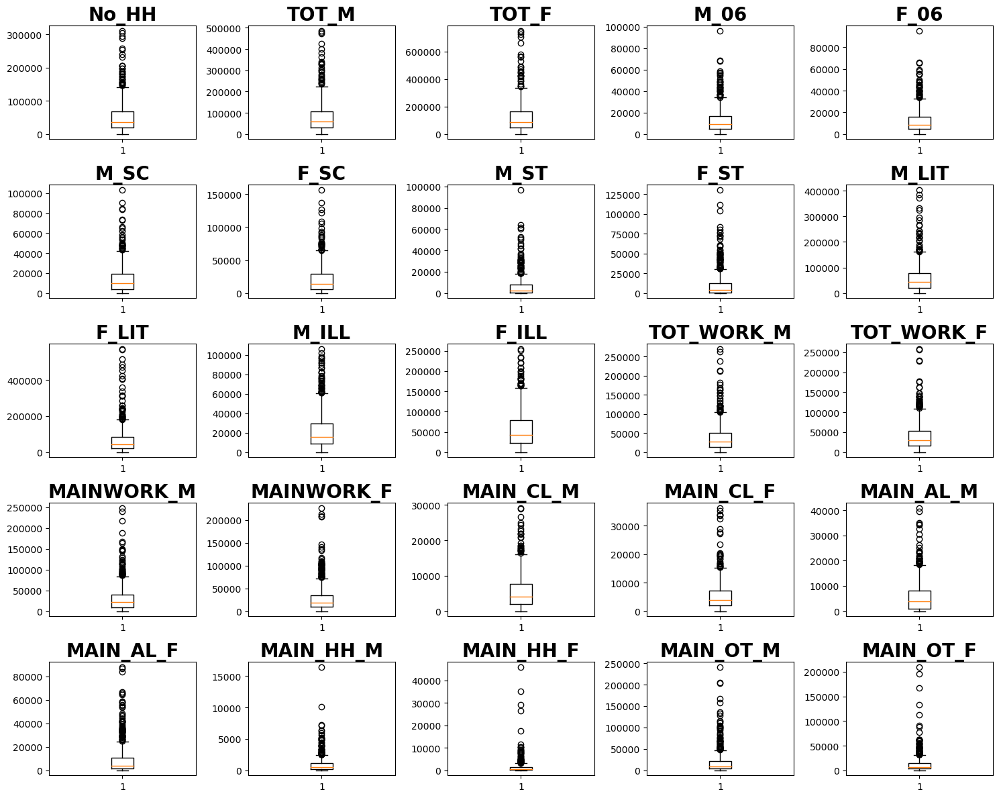

In [29]:
fig,axs=plt.subplots(nrows=5,ncols=5,figsize=(15,12))
for i,ax in enumerate(axs.flat):
    ax.boxplot(numdata1.iloc[:,i])
    df1.iloc[:,i]
    ax.set_title(numdata1.columns[i],fontsize=20,fontweight='bold')
    
plt.tight_layout()

In [30]:
from scipy.stats import zscore
numdata1_scaled=numdata1.apply(zscore)
numdata1_scaled.head()


,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,-0.904738,-0.771236,-0.815563,-0.561012,-0.507738,-0.958575,-0.957049,-0.423306,-0.476423,-0.798097,...,-0.163229,-0.720610,-0.156494,-0.287524,0.156577,-0.657412,-0.365258,-0.499977,-0.413053,-0.539614
1,-0.935695,-0.823100,-0.874534,-0.681096,-0.725367,-0.958297,-0.956772,-0.582014,-0.607607,-0.849434,...,-0.583103,-0.732811,-0.282327,-0.294688,-0.491731,-0.723062,0.042855,-0.073481,-0.606455,-0.598988
2,-0.972412,-1.000919,-0.981466,-0.976956,-0.965262,-0.958575,-0.956772,-0.038951,-0.027273,-0.956457,...,-0.859212,-0.921931,-0.456727,-0.420050,-0.731894,-0.795026,-0.662068,-0.635680,-0.726103,-0.707839
3,-1.037530,-1.052224,-1.041001,-1.022118,-0.995393,-0.958783,-0.957049,-0.355965,-0.390060,-1.004643,...,-0.805468,-0.900758,-0.419198,-0.385127,-0.718770,-0.784926,-0.624966,-0.616294,-0.645791,-0.710038
4,-0.822676,-0.809381,-0.813933,-0.622359,-0.649908,-0.957395,-0.955529,0.149238,0.043330,-0.800568,...,-0.348645,-0.297513,0.472670,0.434200,-0.466796,-0.625849,-0.439461,-0.309346,-0.540895,-0.249344


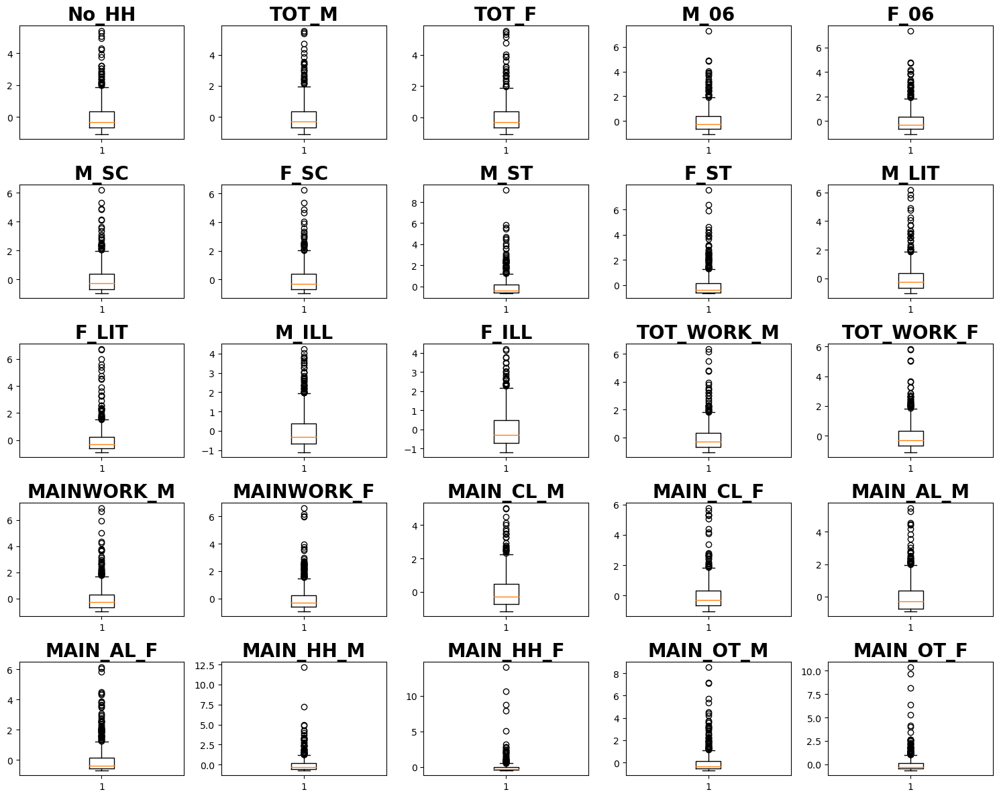

In [31]:
fig,axs=plt.subplots(nrows=5,ncols=5,figsize=(15,12))
for i,ax in enumerate(axs.flat):
    ax.boxplot(numdata1_scaled.iloc[:,i])
    df1.iloc[:,i]
    ax.set_title(numdata1_scaled.columns[i],fontsize=20,fontweight='bold')
    
plt.tight_layout()

In [32]:
numdata1_scaled.head()

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,-0.904738,-0.771236,-0.815563,-0.561012,-0.507738,-0.958575,-0.957049,-0.423306,-0.476423,-0.798097,...,-0.163229,-0.720610,-0.156494,-0.287524,0.156577,-0.657412,-0.365258,-0.499977,-0.413053,-0.539614
1,-0.935695,-0.823100,-0.874534,-0.681096,-0.725367,-0.958297,-0.956772,-0.582014,-0.607607,-0.849434,...,-0.583103,-0.732811,-0.282327,-0.294688,-0.491731,-0.723062,0.042855,-0.073481,-0.606455,-0.598988
2,-0.972412,-1.000919,-0.981466,-0.976956,-0.965262,-0.958575,-0.956772,-0.038951,-0.027273,-0.956457,...,-0.859212,-0.921931,-0.456727,-0.420050,-0.731894,-0.795026,-0.662068,-0.635680,-0.726103,-0.707839
3,-1.037530,-1.052224,-1.041001,-1.022118,-0.995393,-0.958783,-0.957049,-0.355965,-0.390060,-1.004643,...,-0.805468,-0.900758,-0.419198,-0.385127,-0.718770,-0.784926,-0.624966,-0.616294,-0.645791,-0.710038
4,-0.822676,-0.809381,-0.813933,-0.622359,-0.649908,-0.957395,-0.955529,0.149238,0.043330,-0.800568,...,-0.348645,-0.297513,0.472670,0.434200,-0.466796,-0.625849,-0.439461,-0.309346,-0.540895,-0.249344


In [33]:
numdata1_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 57 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   No_HH           640 non-null    float64
 1   TOT_M           640 non-null    float64
 2   TOT_F           640 non-null    float64
 3   M_06            640 non-null    float64
 4   F_06            640 non-null    float64
 5   M_SC            640 non-null    float64
 6   F_SC            640 non-null    float64
 7   M_ST            640 non-null    float64
 8   F_ST            640 non-null    float64
 9   M_LIT           640 non-null    float64
 10  F_LIT           640 non-null    float64
 11  M_ILL           640 non-null    float64
 12  F_ILL           640 non-null    float64
 13  TOT_WORK_M      640 non-null    float64
 14  TOT_WORK_F      640 non-null    float64
 15  MAINWORK_M      640 non-null    float64
 16  MAINWORK_F      640 non-null    float64
 17  MAIN_CL_M       640 non-null    flo

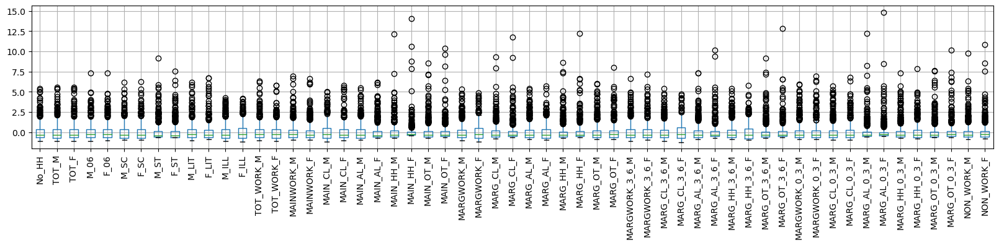

In [34]:
numdata1_scaled.boxplot(figsize=(20,3))
plt.xticks(rotation=90)
plt.show()

In [35]:
!pip install factor_analyzer 

In [36]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(numdata1_scaled)
p_value

C:\Users\THANUSRI\anaconda31\Lib\site-packages\factor_analyzer\factor_analyzer.py:109: RuntimeWarning: divide by zero encountered in log
  statistic = -np.log(corr_det) * (n - 1 - (2 * p + 5) / 6)


0.0

In [37]:
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(numdata1_scaled)
kmo_model

C:\Users\THANUSRI\anaconda31\Lib\site-packages\factor_analyzer\utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(


0.8039889932781237

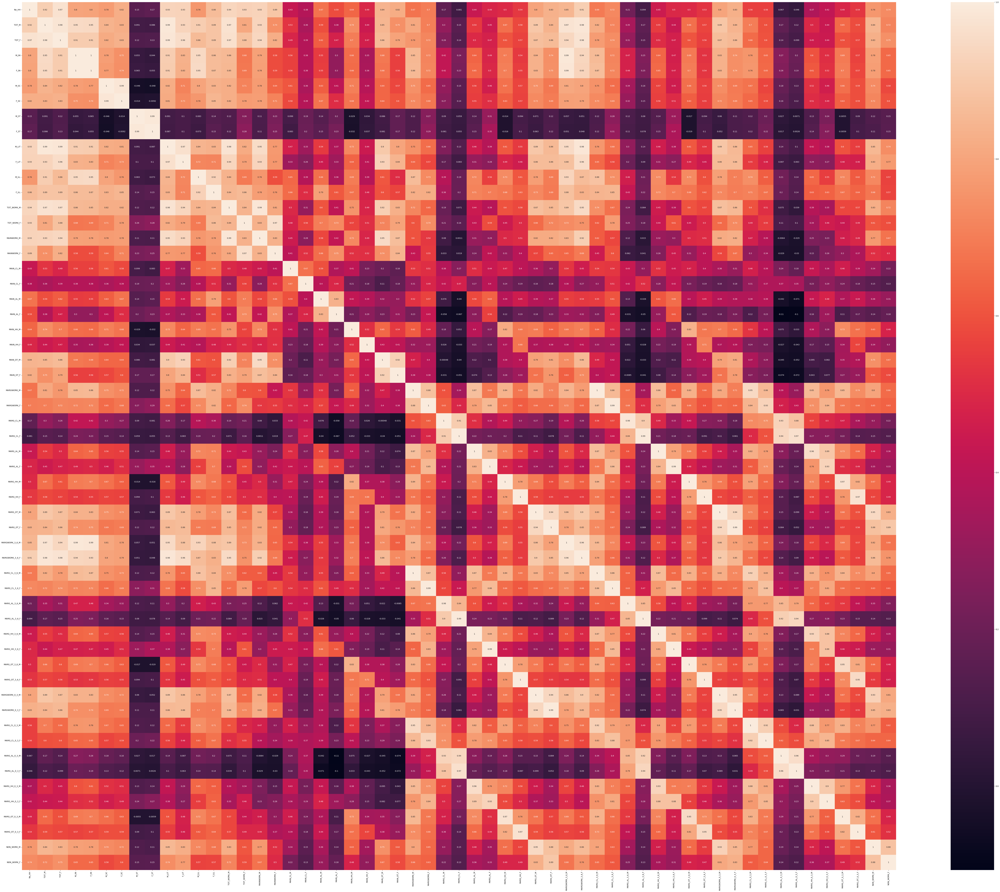

In [38]:
plt.figure(figsize = (100,80))
sns.heatmap(numdata1_scaled.corr(), annot=True);

In [39]:
from sklearn.decomposition import PCA
pca = PCA(n_components=57, random_state=123)
df_pca = pca.fit_transform(numdata1_scaled)
df_pca.transpose().round(2)

array([[-4.62, -4.77, -5.96, ..., -6.29, -6.22, -5.9 ],
       [ 0.14, -0.11, -0.29, ..., -0.64, -0.67, -0.94],
       [ 0.33,  0.24,  0.37, ...,  0.11,  0.27,  0.35],
       ...,
       [ 0.  ,  0.  , -0.  , ..., -0.  , -0.  ,  0.  ],
       [ 0.  , -0.  ,  0.  , ..., -0.  ,  0.  , -0.  ],
       [ 0.  , -0.  ,  0.  , ...,  0.  , -0.  ,  0.  ]])

In [40]:
print('Eigen Vectors \n %s',pca.components_.round(2))

Eigen Vectors 
 %s [[ 0.16  0.17  0.17 ...  0.13  0.15  0.13]
 [-0.13 -0.09 -0.1  ...  0.05 -0.07 -0.07]
 [-0.    0.06  0.04 ... -0.08  0.11  0.1 ]
 ...
 [-0.   -0.17 -0.1  ...  0.01 -0.04 -0.02]
 [-0.   -0.01 -0.08 ...  0.05 -0.17  0.04]
 [ 0.    0.18  0.04 ... -0.   -0.06 -0.04]]


In [41]:
var_exp = pca.explained_variance_ratio_
print(var_exp.round(2))

[0.56 0.14 0.07 0.06 0.04 0.03 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.  ]


In [42]:
cum_var_exp = np.cumsum(var_exp)
print('Cumulative Variance Explained in Percentage:',(cum_var_exp*100).round(2))

Cumulative Variance Explained in Percentage: [ 55.73  69.51  76.79  83.21  87.08  90.47  92.53  93.85  94.93  95.85
  96.61  97.23  97.75  98.24  98.57  98.81  99.01  99.2   99.37  99.51
  99.61  99.69  99.75  99.81  99.85  99.89  99.92  99.94  99.96  99.97
  99.98  99.99 100.   100.   100.   100.   100.   100.   100.   100.
 100.   100.   100.   100.   100.   100.   100.   100.   100.   100.
 100.   100.   100.   100.   100.   100.   100.  ]


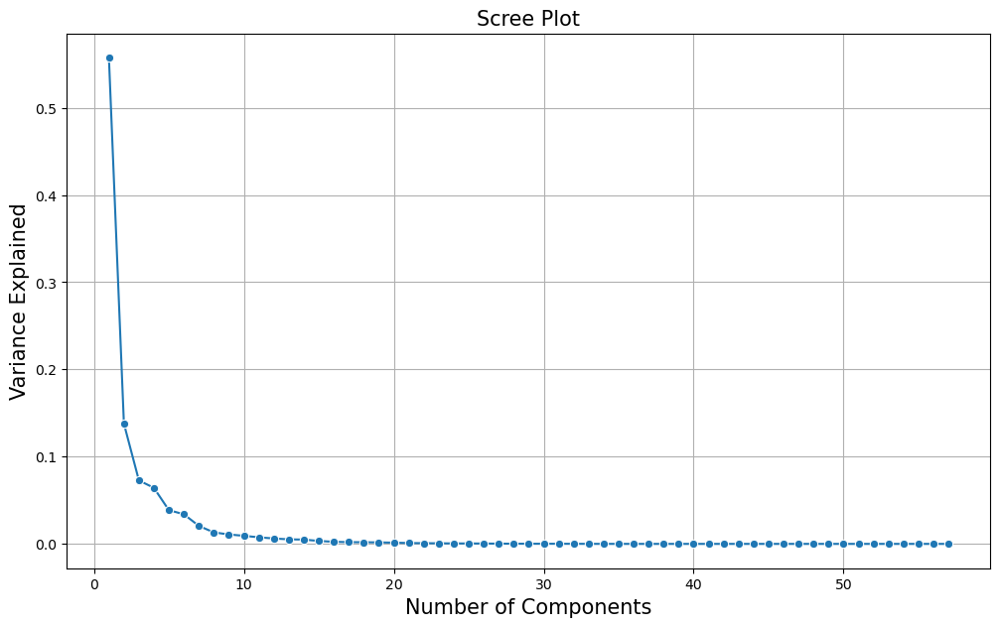

In [43]:
plt.figure(figsize=(12,7))
sns.lineplot(y=var_exp,x=range(1,len(var_exp)+1),marker='o')
plt.xlabel('Number of Components',fontsize=15)
plt.ylabel('Variance Explained',fontsize=15)
plt.title('Scree Plot',fontsize=15)
plt.grid()
plt.show()

In [44]:
from sklearn.decomposition import PCA

In [45]:
pca = PCA(n_components=6, random_state=123)
df_pca = pca.fit_transform(numdata1_scaled)
df_pca.transpose().round(2)

array([[-4.62, -4.77, -5.96, ..., -6.29, -6.22, -5.9 ],
       [ 0.14, -0.11, -0.29, ..., -0.64, -0.67, -0.94],
       [ 0.33,  0.24,  0.37, ...,  0.11,  0.27,  0.35],
       [ 1.54,  1.96,  0.62, ...,  1.37,  1.14,  1.11],
       [ 0.35, -0.15,  0.48, ...,  0.15,  0.06,  0.15],
       [-0.42,  0.42,  0.28, ...,  0.14, -0.12, -0.15]])

In [46]:
df_pca.shape

(640, 6)

In [47]:
pca.components_

array([[ 1.56020579e-01,  1.67117635e-01,  1.65553179e-01,
         1.62192948e-01,  1.62566396e-01,  1.51357849e-01,
         1.51566500e-01,  2.72341946e-02,  2.81833150e-02,
         1.61992837e-01,  1.46872680e-01,  1.61749445e-01,
         1.65248187e-01,  1.59871988e-01,  1.45935804e-01,
         1.46200730e-01,  1.23970284e-01,  1.03127159e-01,
         7.45397856e-02,  1.13355712e-01,  7.38821590e-02,
         1.31572584e-01,  8.33826397e-02,  1.23526242e-01,
         1.11021264e-01,  1.64615479e-01,  1.55395618e-01,
         8.23885414e-02,  4.91953957e-02,  1.28598563e-01,
         1.14305073e-01,  1.40853227e-01,  1.27669598e-01,
         1.55262872e-01,  1.47286584e-01,  1.64971950e-01,
         1.61253433e-01,  1.65501611e-01,  1.55647049e-01,
         9.30142064e-02,  5.15358640e-02,  1.28576116e-01,
         1.10645843e-01,  1.39592763e-01,  1.24545909e-01,
         1.54293786e-01,  1.46285654e-01,  1.50125706e-01,
         1.40157047e-01,  5.25417829e-02,  4.17859530e-0

In [48]:
pca.components_.round(2)

array([[ 0.16,  0.17,  0.17,  0.16,  0.16,  0.15,  0.15,  0.03,  0.03,
         0.16,  0.15,  0.16,  0.17,  0.16,  0.15,  0.15,  0.12,  0.1 ,
         0.07,  0.11,  0.07,  0.13,  0.08,  0.12,  0.11,  0.16,  0.16,
         0.08,  0.05,  0.13,  0.11,  0.14,  0.13,  0.16,  0.15,  0.16,
         0.16,  0.17,  0.16,  0.09,  0.05,  0.13,  0.11,  0.14,  0.12,
         0.15,  0.15,  0.15,  0.14,  0.05,  0.04,  0.12,  0.12,  0.14,
         0.13,  0.15,  0.13],
       [-0.13, -0.09, -0.1 , -0.02, -0.02, -0.05, -0.05,  0.03,  0.03,
        -0.12, -0.15, -0.01, -0.01, -0.13, -0.09, -0.18, -0.15,  0.06,
         0.09, -0.03, -0.06, -0.08, -0.08, -0.21, -0.21,  0.09,  0.13,
         0.27,  0.25,  0.17,  0.14,  0.07,  0.02, -0.09, -0.12, -0.04,
        -0.11,  0.08,  0.1 ,  0.26,  0.24,  0.16,  0.13,  0.06,  0.01,
        -0.09, -0.13,  0.15,  0.18,  0.25,  0.24,  0.19,  0.18,  0.08,
         0.05, -0.07, -0.07],
       [-0.  ,  0.06,  0.04,  0.06,  0.05,  0.  , -0.03, -0.12, -0.14,
         0.08,  0

In [49]:
var_exp_1 = pca.explained_variance_ratio_.round(2)

In [50]:
pca.explained_variance_ratio_.round(2)

array([0.56, 0.14, 0.07, 0.06, 0.04, 0.03])

In [51]:
df_pca_loading = pd.DataFrame(pca.components_.round(2),columns=list(numdata1_scaled))
df_pca_loading.shape

(6, 57)

In [52]:
df_pca_loading.head(8)

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,0.16,0.17,0.17,0.16,0.16,0.15,0.15,0.03,0.03,0.16,...,0.15,0.14,0.05,0.04,0.12,0.12,0.14,0.13,0.15,0.13
1,-0.13,-0.09,-0.10,-0.02,-0.02,-0.05,-0.05,0.03,0.03,-0.12,...,0.15,0.18,0.25,0.24,0.19,0.18,0.08,0.05,-0.07,-0.07
2,-0.00,0.06,0.04,0.06,0.05,0.00,-0.03,-0.12,-0.14,0.08,...,0.05,0.02,0.27,0.28,-0.14,-0.20,-0.02,-0.08,0.11,0.10
3,-0.13,-0.02,-0.07,0.01,0.01,0.01,-0.03,-0.22,-0.23,-0.04,...,0.09,-0.02,-0.10,-0.14,0.13,0.00,0.23,0.21,0.08,0.02
4,-0.01,-0.03,-0.01,-0.05,-0.04,-0.17,-0.16,0.43,0.44,-0.01,...,0.08,0.13,-0.05,-0.05,0.06,0.13,-0.04,0.00,0.16,0.24
5,0.00,-0.07,-0.04,-0.16,-0.15,-0.06,-0.04,0.22,0.23,-0.06,...,-0.06,-0.00,0.07,0.08,-0.12,-0.11,0.06,0.30,-0.05,-0.02


In [53]:
from matplotlib.patches import Rectangle

In [54]:
df_pca = pd.DataFrame(df_pca.round(2),columns=['PC1','PC2','PC3','PC4','PC5','PC6'])
df_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
0,-4.62,0.14,0.33,1.54,0.35,-0.42
1,-4.77,-0.11,0.24,1.96,-0.15,0.42
2,-5.96,-0.29,0.37,0.62,0.48,0.28
3,-6.28,-0.50,0.21,1.07,0.30,0.05
4,-4.48,0.89,1.08,0.54,0.80,0.34


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_8704\2533860987.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_8704\2533860987.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_8704\2533860987.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_8704\2533860987.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_8704\2533860987.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


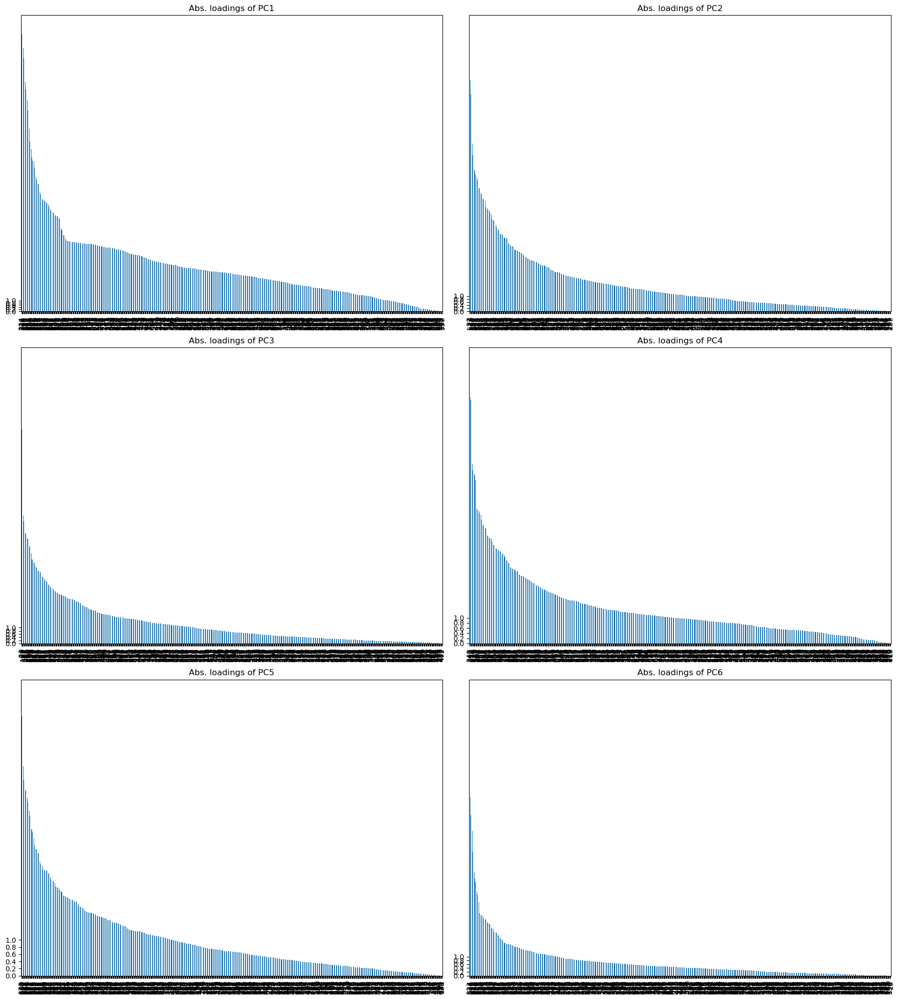

In [55]:
plt.figure(figsize = (18,20))
for i in range(len(df_pca.columns)):
    plt.subplot(3,2,i+1)
    abs(df_pca[df_pca.columns[i]]).T.sort_values(ascending = False).plot.bar()
    plt.yticks(np.arange(0,1.2,0.2))
    plt.title('Abs. loadings of {}'.format(df_pca.columns[i]))
    plt.tight_layout()

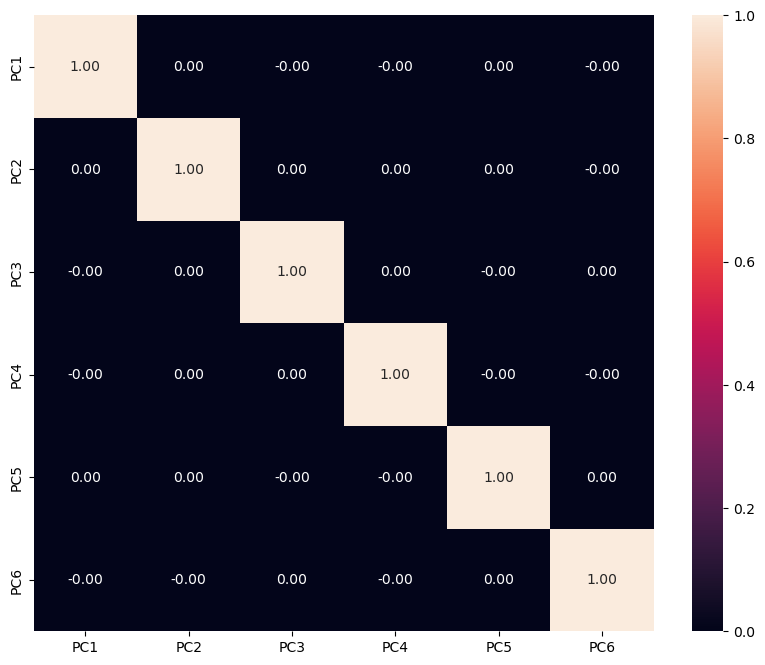

In [56]:
plt.figure(figsize=(10,8))
sns.heatmap(df_pca.corr(),annot=True,fmt='.2f');